In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import sklearn
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow import keras
from keras import Input, Model
from keras.models import load_model
from keras.layers import Dense, Activation, LayerNormalization, MultiHeadAttention, Conv2D, UpSampling2D, Conv2DTranspose, AveragePooling2D, GlobalAveragePooling2D, MultiHeadAttention, Embedding 
from keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator
import albumentations as album
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
# github의 keras_unet_collection에서 backbone을 활용
import os
import shutil

auto = tf.data.AUTOTUNE
res = 128
batch_size = 10
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Task 설명
- Image classification
    - Naive, benchmark (CNN + FCN)
    - ViT (정확히는 Convolution patching + self-attention), CNN + self attention
- Image Segmentation
    - With UNet-ish model
    - With UNet + Pix2Pix GAN

# EDA and creating data generator (tf.dataset)
- 마스크 데이터와 이미지 데이터가 섞여 있음
- Category별로 마스크/이미지를 분리하여 (필요하다면) 새로운 directory로 준비 
    - tf.kears.utils.image_dataset_from_directory를 위해서는 새로운 directory를 준비해야 함

In [2]:
mother_dir = "../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT"
benign_dir, malig_dir, normal_dir = os.path.join(mother_dir, 'benign'), os.path.join(mother_dir, 'malignant'), os.path.join(mother_dir, 'normal')
def get_files_split(directory):
    image, mask = [], []
    for file in tqdm(os.listdir(directory)):
        if file.find('mask') == -1:
            image.append(os.path.join(directory, file))
        else:
            if file.split("_")[-1] == "mask.png":
                mask.append(os.path.join(directory, file))
    image.sort()
    mask.sort()
    return image, mask
benign_image, benign_mask = get_files_split(benign_dir)
malig_image, malig_mask = get_files_split(malig_dir)
normal_image, normal_mask = get_files_split(normal_dir)

whole_image = normal_image + benign_image + malig_image
whole_mask = normal_mask + benign_mask + malig_mask
whole_label = [0]*len(normal_image) + [1]*len(benign_image) + [2]*len(malig_image)

df_whole = pd.DataFrame({'image_path' : whole_image,
                        'mask_path' : whole_mask,
                        'label' : whole_label})
df_train, df_val = train_test_split(df_whole, test_size = 0.2)
df_train.to_csv("Train.csv")
df_val.to_csv('Validation.csv')

  0%|          | 0/891 [00:00<?, ?it/s]

  0%|          | 0/421 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

> Image Curation

In [3]:
dict2name = {0:"Normal",
            1:"Benign lesion",
            2:"Malignant"}
import random
idx = random.choice(range(df_train.shape[0]))
def get_img_array(path, res = res):
    img = load_img(path, target_size = (res,res), color_mode='grayscale')
    img = img_to_array(img)
    img = np.array(img).astype(np.uint8)
    return img

def curation(dataframe):
    idx = random.choice(range(dataframe.shape[0]))
    img_path = dataframe.iloc[idx].image_path
    print(img_path)
    mask_path = dataframe.iloc[idx].mask_path
    label = dataframe.iloc[idx].label
    fig, axes = plt.subplots(1,2, figsize = (20,10))
    axes = axes.flatten()
    axes[0].imshow(get_img_array(img_path), cmap = "gray")
    axes[0].set_title(dict2name[label])
    
    axes[1].imshow(get_img_array(mask_path), cmap = "gray")
    axes[1].set_title(f"{dict2name[label]}_segmentation_mask")
    
    plt.show()

../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/malignant/malignant (205).png


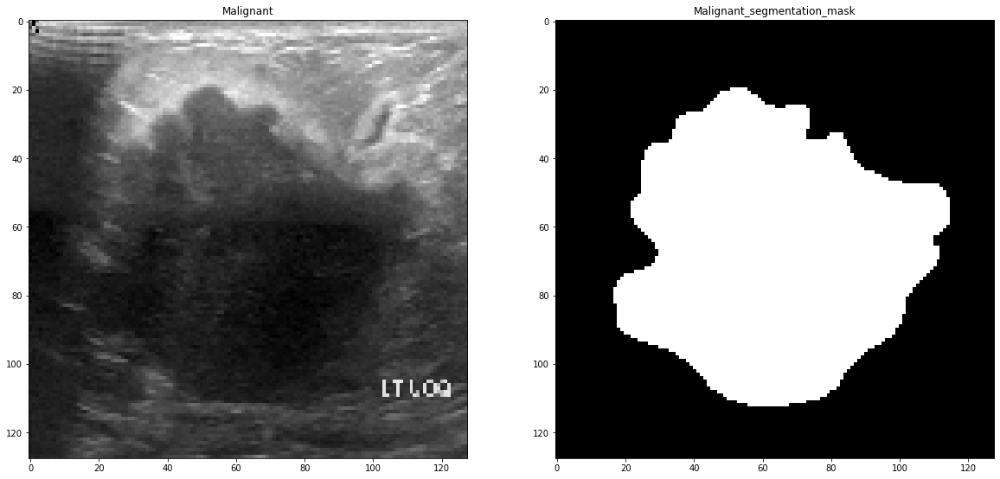

../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (192).png


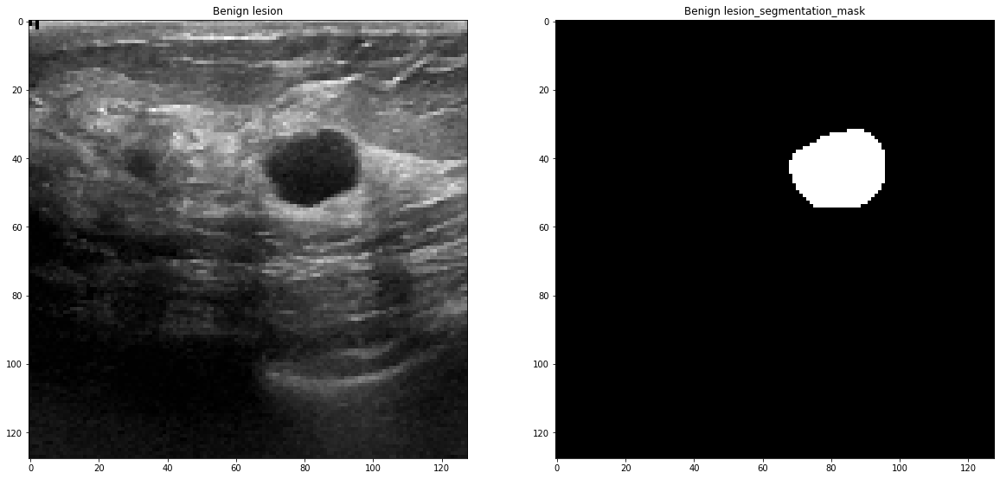

../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (199).png


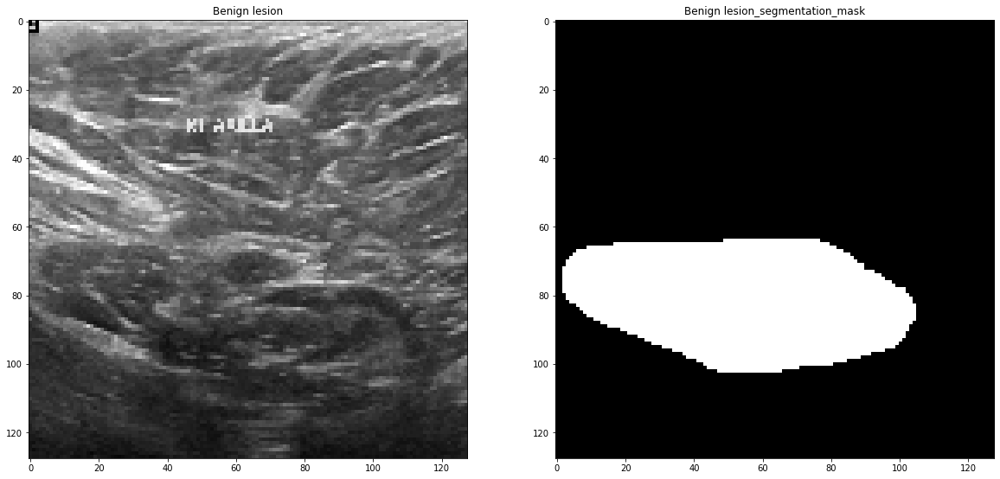

../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (301).png


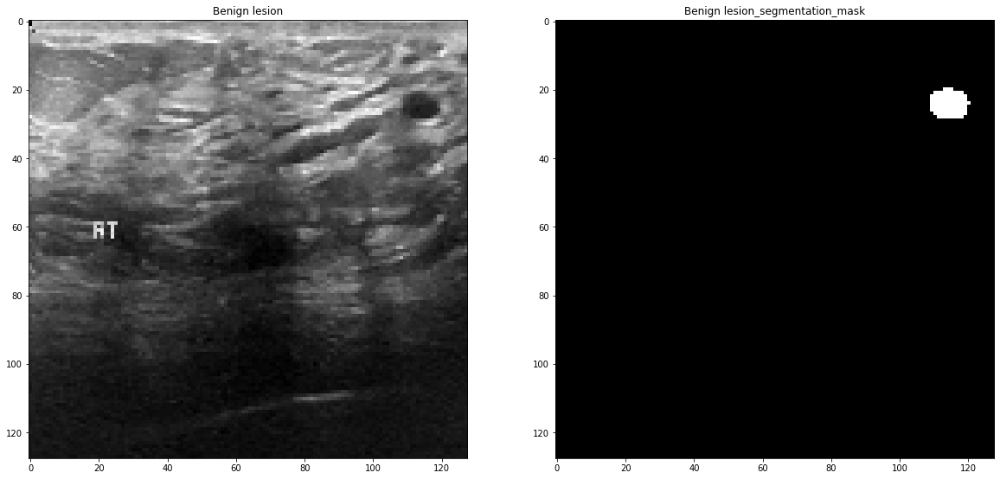

../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (107).png


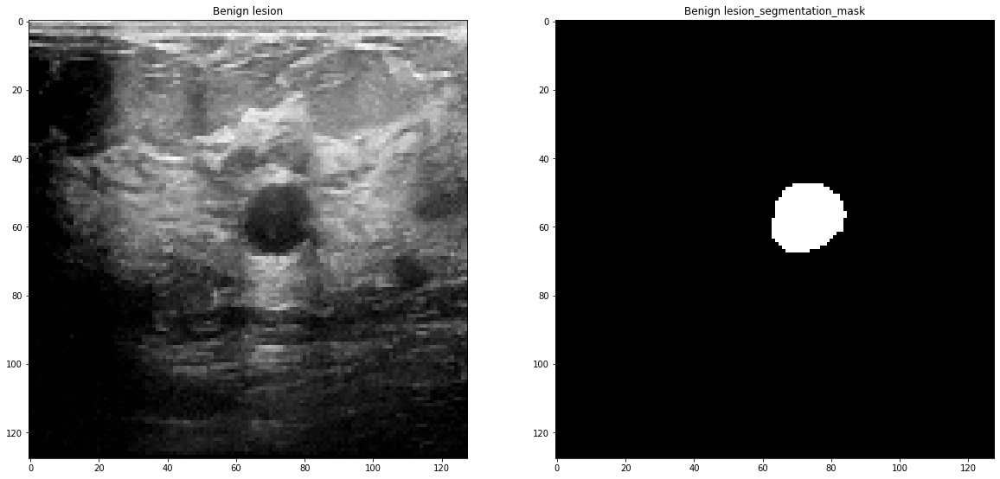

In [4]:
for _ in range(5):
    curation(df_train)

../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/normal/normal (45).png


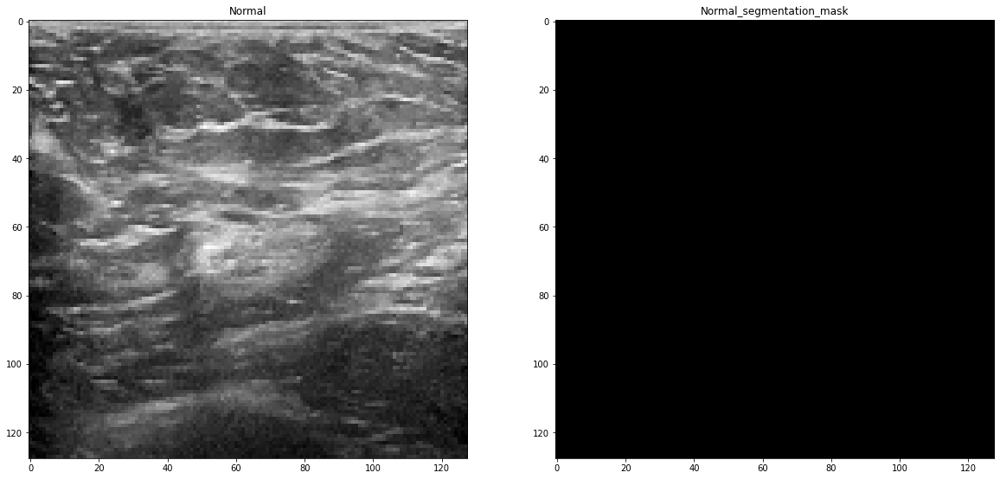

../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/malignant/malignant (43).png


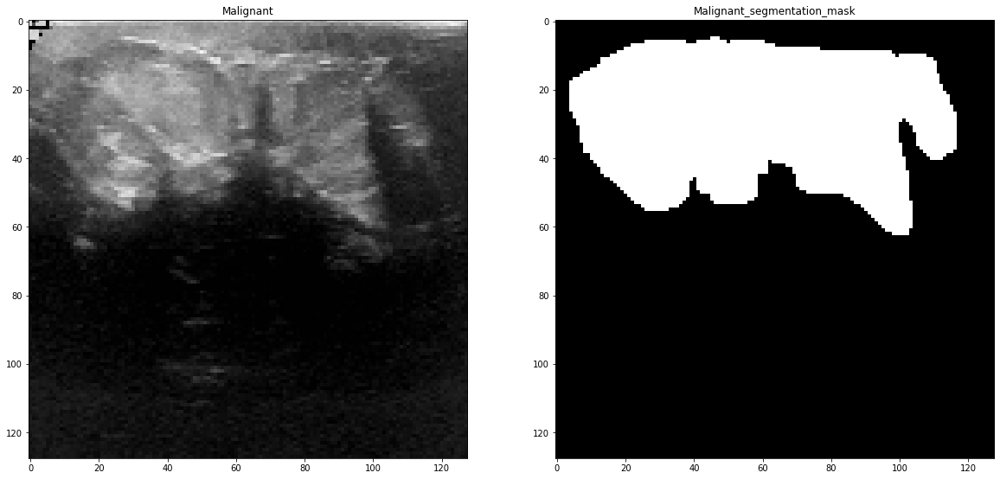

../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/malignant/malignant (175).png


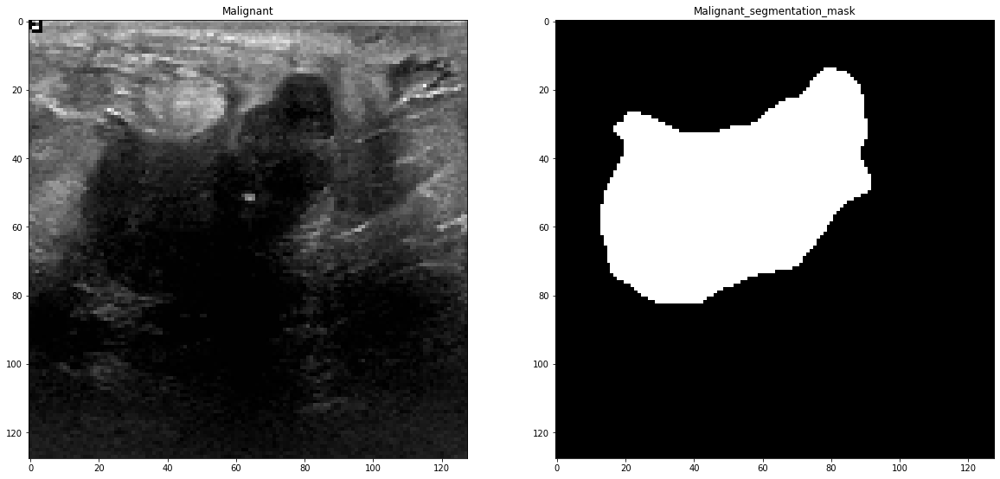

../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (112).png


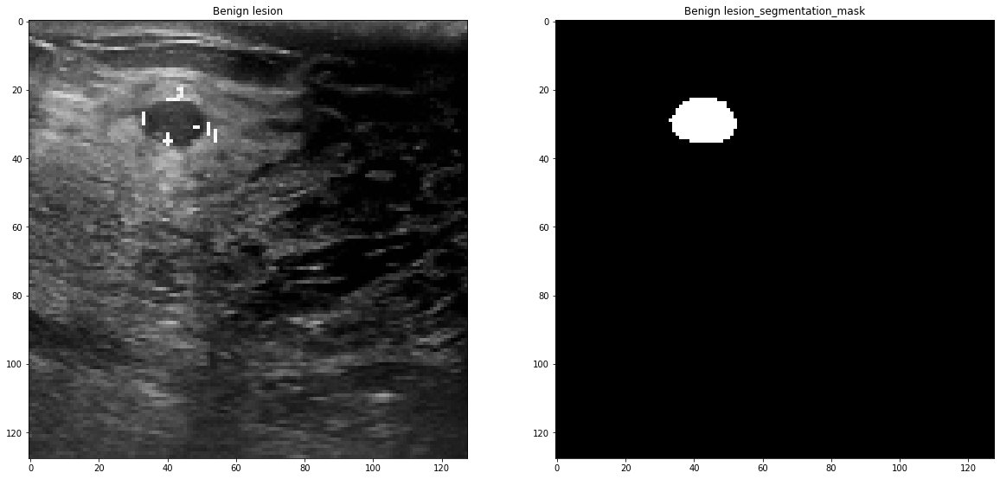

../input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/normal/normal (34).png


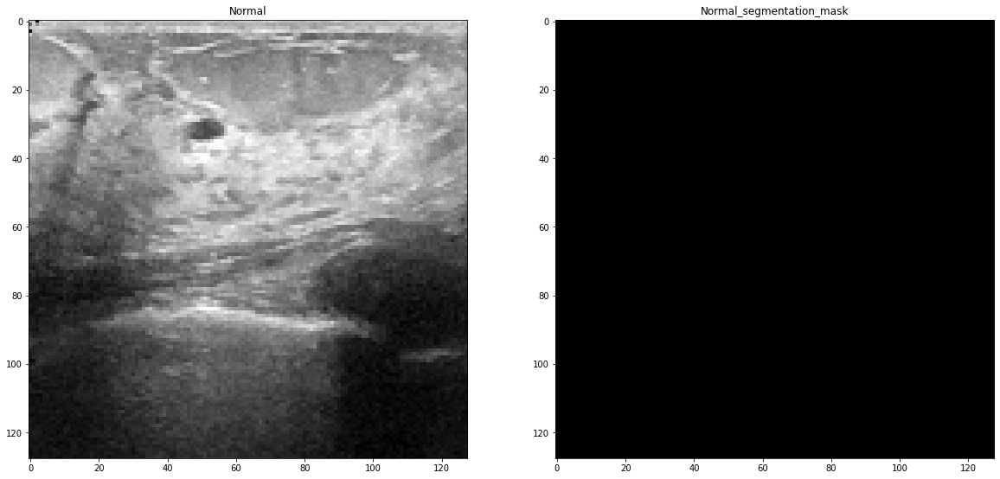

In [5]:
for _ in range(5):
    curation(df_val)

> Image check 결과
- 256by256이면 충분한 듯
- lesion의 크기가 다양, 작은 lesion의 검출 문제도 있음 : Dice loss 고려 및 Feature Pyramid Network 고려하여 classifier model 작성하는 것이 도움이 될 듯
    - 배경 면적 >> lesion 면적 -> Unet loss로는 Sigmoid Focal Crossentropy 고려
- CLAHE augmentation 사용 : Echogenecity 세팅이 조금씩 다름, lesion 자체가 hypoechoic한 건 맞지만 배경조직의 echogenecity가 다른 것도 모델에 영향을 줄 수 있을 것
    - lesion의 echogenecity가 아니라 타 조직과의 echogenecity와의 차이도 학습하도록 유도

In [6]:
def make_generator(): 
    datagen = ImageDataGenerator() 
    generator = datagen.flow_from_dataframe(df_train, x_col = "image_path", y_col = "label",
                                                        target_size=(res, res), batch_size = batch_size,
                                                        class_mode='raw') 
    return generator
train_ds = tf.data.Dataset.from_generator(make_generator, (tf.uint8, tf.int32)
                                         ) #arranged solution from https://stackoverflow.com/questions/54606302/tf-data-dataset-from-tf-keras-preprocessing-image-imagedatagenerator-flow-from-d

def make_generator_val(): 
    datagen = ImageDataGenerator() 
    generator = datagen.flow_from_dataframe(df_val, x_col = "image_path", y_col = "label",
                                                        target_size=(res, res), 
                                                        class_mode="raw", batch_size=batch_size) 
    return generator
val_ds = tf.data.Dataset.from_generator(make_generator_val, (tf.uint8, tf.int32)
                                         )

2022-09-06 14:52:49.321094: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-06 14:52:49.467025: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-06 14:52:49.471221: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-06 14:52:49.478037: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [7]:
for img, lab in train_ds.take(1):
    print(img.shape)
    print(lab.shape)
    
for img, lab in val_ds.take(1):
    print(img.shape)
    print(lab.shape)
#train, validation dataset 정상 작동 확인

2022-09-06 14:52:53.166893: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Found 624 validated image filenames.
(10, 128, 128, 3)
(10,)
Found 156 validated image filenames.
(10, 128, 128, 3)
(10,)


# Dataset from generator For Image segmentation:
- Albumentation으로 mask 및 원본 이미지를 동시에 augment
- zip으로 두 generator를 묶고 (shuffle False) call가능하게 함수로 wrap

Found 624 validated image filenames.
Found 624 validated image filenames.
(10, 128, 128, 3) (10,) (10, 128, 128, 1) 0.0 1.0


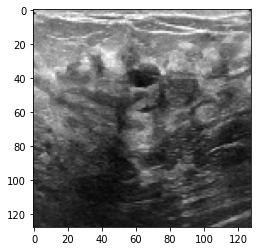

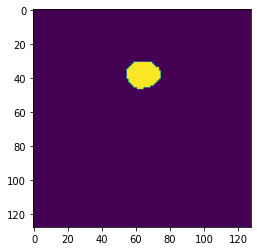

tf.Tensor(1, shape=(), dtype=int32)
----------------


In [8]:
def make_whole_generator(): #train 
    datagen = ImageDataGenerator(rescale = 1/255)
    df_shuffle = sklearn.utils.shuffle(df_train)
    image_gen = datagen.flow_from_dataframe(df_shuffle, x_col = "image_path", y_col = "label",
                                                        target_size=(res, res), batch_size = batch_size,
                                                        class_mode=None, shuffle = False)
    mask_gen = datagen.flow_from_dataframe(df_shuffle, x_col = "mask_path", y_col = "label",
                                                        target_size=(res, res), batch_size = batch_size, color_mode = "grayscale",
                                                        class_mode="raw", shuffle = False)
    image_mask_gen = zip(image_gen, mask_gen)
    
    return image_mask_gen

train_whole_ds = tf.data.Dataset.from_generator(make_whole_generator, (tf.float32, (tf.float32, tf.int32))
                                         ) #arranged solution from https://stackoverflow.com/questions/54606302/tf-data-dataset-from-tf-keras-preprocessing-image-imagedatagenerator-flow-from-d

for img, (mask, lab) in train_whole_ds.take(1):
    print(img.shape, lab.shape, mask.shape, np.min(mask), np.max(mask))
    plt.imshow(img[0])
    plt.show()
    plt.imshow(mask[0])
    plt.show()
    print(lab[0])
    print("----------------")

In [9]:
def make_whole_val_generator(): #train 
    datagen = ImageDataGenerator(rescale = 1/255)
    df_shuffle = sklearn.utils.shuffle(df_val)
    image_gen = datagen.flow_from_dataframe(df_shuffle, x_col = "image_path", y_col = "label",
                                                        target_size=(res, res), batch_size = batch_size,
                                                        class_mode=None, shuffle = False)
    mask_gen = datagen.flow_from_dataframe(df_shuffle, x_col = "mask_path", y_col = "label",
                                                        target_size=(res, res), batch_size = batch_size, color_mode = 'grayscale',
                                                        class_mode="raw", shuffle = False)
    image_mask_gen = zip(image_gen, mask_gen)
    
    return image_mask_gen

val_whole_ds = tf.data.Dataset.from_generator(make_whole_val_generator, (tf.float32, (tf.float32, tf.int32))
                                         ) #arranged solution from https://stackoverflow.com/questions/54606302/tf-data-dataset-from-tf-keras-preprocessing-image-imagedatagenerator-flow-from-d
val_whole_ds

<FlatMapDataset shapes: (<unknown>, (<unknown>, <unknown>)), types: (tf.float32, (tf.float32, tf.int32))>

# Modelling - Generator, Discriminator, Classifier
- 3구조를 End-to-End로 연결하여 한 번의 fitting으로 Generator 및 Classifier를 모두 training 가능하게 만들자
- Simple U-Net으로는 성공적인 Segmentation이 어렵다는 것을 ~version 33에서 알게 됨
    - Attention U-Net을 구현해서 Generator로 쓰자

In [10]:
def get_conv(x, units = [128, 256]):
    for unit in units:
        x = Conv2D(filters = unit, kernel_size = 3, activation = None, padding = "SAME")(x)
        x = LayerNormalization()(x)
        x = Activation('swish')(x)
    return x

def attention_block(upsampled, encoder_layer, filters = 128):
    # encoder_layer와 att weight를 곱한 것이 output
    upsampled_w = Conv2D(filters = filters, kernel_size = 1, strides = 1, padding = 'SAME')(upsampled)
    upsampled_w = LayerNormalization()(upsampled_w)
    upsampled_w = Activation('swish')(upsampled_w)
    
    encoder_layer_w = Conv2D(filters = filters, kernel_size = 1, strides = 1, padding = 'SAME')(encoder_layer)
    encoder_layer_w = LayerNormalization()(encoder_layer_w)
    encoder_layer_w = Activation('swish')(encoder_layer_w)
    
    add = keras.layers.Add()([upsampled_w, encoder_layer_w])
    relu = Activation('relu')(add)
    att_weight = Conv2D(filters = 1, kernel_size = 1, strides = 1, padding = 'SAME', activation = 'sigmoid')(relu) #batch, w, h, 1
    weighted_encoder = keras.layers.Multiply()([att_weight, encoder_layer])
    return weighted_encoder

def get_generator():
    initializer = tf.random_normal_initializer(0., 0.02)
    #encoder 부분에는 FPN 적용
    inputs = Input(shape = [res,res,3], name = 'SonoImage')
    ##################Encoder block###################
    #256,128,64,32,16,8 - 64,32,16,8을 추출
    conv_256 = Conv2D(filters = 32, kernel_size = 9, activation = None, name = "Encoder1st", padding = "SAME")(inputs)
    conv_256 = LayerNormalization()(conv_256)
    conv_256 = Activation(tf.keras.layers.LeakyReLU(alpha=0.2) )(conv_256) #256
    
    conv_128 = AveragePooling2D(name = 'EncoderAct1st')(conv_256) #128
    conv_128 = Conv2D(filters = 64, kernel_size = 7, activation = None, name = "Encoder2nd", padding = "SAME")(conv_128)
    conv_128 = LayerNormalization()(conv_128)
    conv_128 = Activation(tf.keras.layers.LeakyReLU(alpha=0.2))(conv_128)
    
    conv_64 = AveragePooling2D(name = 'EncoderAct2nd')(conv_128) #64
    conv_64 = Conv2D(filters = 128, kernel_size = 7, activation = None, name = "Encoder3rd", padding = "SAME")(conv_64)
    conv_64 = LayerNormalization()(conv_64)
    conv_64 = Activation(tf.keras.layers.LeakyReLU(alpha=0.2))(conv_64)
    
    conv_32 = AveragePooling2D(name = 'EncoderAct3rd')(conv_64) # 32
    conv_32 = Conv2D(filters = 256, kernel_size = 5, activation = None, name = "Encoder4th", padding = "SAME")(conv_32)
    conv_32 = LayerNormalization()(conv_32)
    conv_32 = Activation(tf.keras.layers.LeakyReLU(alpha=0.2))(conv_32)
    
    conv_16 = AveragePooling2D(name = 'EncoderAct4th')(conv_32) #16    
    conv_16 = Conv2D(filters = 512, kernel_size = 3, activation = None, name = "Encoder5th", padding = "SAME")(conv_16)
    conv_16 = LayerNormalization()(conv_16)
    conv_16 = Activation(tf.keras.layers.LeakyReLU(alpha=0.2))(conv_16)
    
    conv_8 = AveragePooling2D(name = 'EncoderAct5th')(conv_16) #8
    conv_8 = Conv2D(filters = 1024, kernel_size = 3, activation = None, name = "Encoder6th", padding = "SAME")(conv_8)
    conv_8 = LayerNormalization()(conv_8)
    conv_8 = Activation(tf.keras.layers.LeakyReLU(alpha=0.2))(conv_8)
    
    ###################Decoder block###################
    decoder_1 = Conv2DTranspose(filters = 512, kernel_size = 5, strides = 2, activation = tf.keras.layers.LeakyReLU(alpha=0.2), padding = 'SAME')(conv_8)
    att_1 = attention_block(UpSampling2D()(conv_8), 
                            conv_16, filters = 256)
    concat_1 = keras.layers.Concatenate(axis = -1)([decoder_1, att_1])
    decoder_1 = Conv2D(filters = 512, kernel_size = 3, activation = 'relu', padding = "SAME", name = "Decoder_1st_16")(concat_1)
    decoder_1 = LayerNormalization()(decoder_1)
    
    decoder_2 = Conv2DTranspose(filters = 256, kernel_size = 5, strides = 2,activation = tf.keras.layers.LeakyReLU(alpha=0.2), padding = "SAME")(decoder_1)
    att_2 = attention_block(UpSampling2D()(decoder_1), 
                            conv_32, filters = 128)
    concat_2 = keras.layers.Concatenate(axis = -1)([decoder_2, att_2])
    decoder_2 = Conv2D(filters = 256, kernel_size = 3, activation = 'relu', padding = "SAME", name = "Decoder_2nd_32")(concat_2)
    decoder_2 = LayerNormalization()(decoder_2)
    
    decoder_3 = Conv2DTranspose(filters = 128, kernel_size = 5, strides = 2,activation = tf.keras.layers.LeakyReLU(alpha=0.2), padding = "SAME")(decoder_2)
    att_3 = attention_block(UpSampling2D()(decoder_2), 
                            conv_64, filters = 64)
    concat_3 = keras.layers.Concatenate(axis = -1)([decoder_3, att_3])
    decoder_3 = Conv2D(filters = 128, kernel_size = 3, activation = 'relu', padding = "SAME", name = "Decoder_3rd_64")(concat_3)
    decoder_3 = LayerNormalization()(decoder_3)
    
    decoder_4 = Conv2DTranspose(filters = 64, kernel_size = 7, strides = 2,activation = tf.keras.layers.LeakyReLU(alpha=0.2), padding = "SAME")(decoder_3)
    att_4 = attention_block(UpSampling2D()(decoder_3), 
                            conv_128, filters = 32)
    concat_4 = keras.layers.Concatenate(axis = -1)([decoder_4, att_4])
    decoder_4 = Conv2D(filters = 64, kernel_size = 3, activation = 'relu', padding = 'SAME', name = "Decoder_4th_128")(concat_4)
    decoder_4 = LayerNormalization()(decoder_4)
    
    decoder_5 = Conv2DTranspose(filters = 64, kernel_size = 7, strides = 2,activation = tf.keras.layers.LeakyReLU(alpha=0.2), padding = "SAME")(decoder_4)
    att_5 = attention_block(UpSampling2D()(decoder_4), 
                            conv_256, filters = 32)
    concat_5 = keras.layers.Concatenate(axis = -1)([decoder_5, att_5])
    decoder_5 = Conv2D(filters = 64, kernel_size = 3, activation = 'relu', padding = 'SAME', name = "Decoder_5th_256")(concat_5)
    decoder_5 = LayerNormalization()(decoder_5)
    norm = LayerNormalization()(decoder_5) #256,256,64
    
    
    mask_generator = Conv2D(filters = 1, kernel_size = 1, activation = tf.keras.layers.LeakyReLU(alpha=0.2), name = "MaskGen", padding = "SAME", kernel_initializer=initializer)(norm)
    ##################
    # classifier block
    flat_8 = GlobalAveragePooling2D()(conv_8)
    proba_8 = Dense(units = 3, activation = "softmax")(flat_8)
    total_proba = Dense(units = 3, activation = "softmax", name = "Classifier")(proba_8)
    
    model = Model(inputs = inputs, outputs = [mask_generator, 
                                              total_proba
                                             ], name = "Generator_Classifier")
    return model
generator = get_generator()
generator.summary()

Model: "Generator_Classifier"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
SonoImage (InputLayer)          [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
Encoder1st (Conv2D)             (None, 128, 128, 32) 7808        SonoImage[0][0]                  
__________________________________________________________________________________________________
layer_normalization (LayerNorma (None, 128, 128, 32) 64          Encoder1st[0][0]                 
__________________________________________________________________________________________________
activation (Activation)         (None, 128, 128, 32) 0           layer_normalization[0][0]        
_______________________________________________________________________________

> Discriminator? Losses?
- 원본 이미지와 target(Ground truth mask image), 원본 이미지와 generator의 output(predicted mask image)를 받아 전자는 일치, 후자는 불일치라고 판단하는 NN
    - target을 GT, generated mask를 fake라고 판단하는 신경망
- PatchGAN이라는 방식을 사용
    - 이미지 원본에 대해 Categorical Crossentropy를 사용하는 것이 아니라
    - 압축한 이미지에 대해 CE loss를 구함 -> 압축한 Feature map의 한 픽셀이 원본 이미지의 Patch를 판단한다고 하여 PatchGAN
- Discriminator의 output은 feature map이고, discriminator의 output을 받아서 두 가지 Loss를 구함
    - Discriminator loss -> discriminator에 input과 target image를 넣어 만든 feature map에서 CE, input - generator output을 넣어 만든 CE의 합
    - Generator loss -> generator는 discriminator와 반대로 fake 이미지를 진짜처럼 만들어야 함
        - 우선 predicted image와 실제 이미지 간 L1 loss (+Classifier loss)
        - discriminator output을 GT라고 분류하는 task도 추가 (CE)

In [11]:
def get_discriminator():
    input_image = Input(shape = [res,res,3], name = "SonoImage")
    target = Input(shape = [res,res,1], name = "MaskToDiscriminate")
    initializer = tf.random_normal_initializer(0., 0.02)
    #하나로 묶어 CNN 통과
    concat = keras.layers.Concatenate(name = "Merging_two_imgs")([input_image, target])
    conv1 = Conv2D(filters = 64, strides = 2, activation = None, kernel_size = 5, padding = "SAME", kernel_initializer=initializer)(concat)
    conv1 = LayerNormalization()(conv1)
    conv1 = Activation(tf.keras.layers.LeakyReLU(alpha=0.2))(conv1)
    
    conv2 = Conv2D(filters = 128, strides = 2, activation = None, kernel_size = 5, padding = "SAME", kernel_initializer=initializer)(conv1)
    conv2 = LayerNormalization()(conv2)
    conv2 = Activation(tf.keras.layers.LeakyReLU(alpha=0.2))(conv2)
    
    conv3 = Conv2D(filters = 256, strides = 2, activation = None, kernel_size = 5, padding = "SAME", kernel_initializer=initializer)(conv2)
    conv3 = LayerNormalization()(conv3)
    conv3 = Activation(tf.keras.layers.LeakyReLU(alpha=0.2))(conv3)
    
    conv4 = Conv2D(filters = 512, activation = None, kernel_size = 3, padding = "SAME", kernel_initializer=initializer)(conv3)
    conv4 = LayerNormalization()(conv4)
    conv4 = Activation(tf.keras.layers.LeakyReLU(alpha=0.2))(conv4)
    
    
    last_layer = Conv2D(filters = 1, kernel_size = 3, activation = tf.keras.layers.LeakyReLU(alpha=0.2), name = "Feature_Map_from_merged", kernel_initializer=initializer)(conv4)
    model = Model(inputs = [input_image, target],
                 outputs = last_layer, name = "Discriminator")
    return model

> Setting loss funtions
- 위 설명 참고

In [12]:
# discriminator losses: GT to GT, Fake to Fake
classifier_loss = tf.keras.losses.SparseCategoricalCrossentropy()
#loss_object = tfa.losses.SigmoidFocalCrossEntropy(from_logits = True)
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits = True)
def discriminator_loss(disc_real_output, #discriminator(image, GT mask)
                       disc_gen_output):
    gt_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output) #truth to truth
    fake_loss = loss_object(tf.zeros_like(disc_gen_output), disc_gen_output) #fake to fake
    tot_loss = gt_loss + fake_loss
    return tot_loss
# Generator Loss는 크게 두 Component - (1) discriminator와 연계, (2) generator 자체의 성능향상
def generator_loss(disc_gen_output, #disc와 연계, discriminator output이 "Truth"가 되게 함 (이걸 generator에게 전달해야 하므로 gen loss)
                   gen_output, target_mask, #generator가 GT와 차이나지 않게 함
                  label_predicted, label_target):
    gan_loss = loss_object(tf.ones_like(disc_gen_output), disc_gen_output)
    class_loss = classifier_loss(label_target, label_predicted)
    l1_loss = tf.reduce_mean(tf.abs(target_mask - gen_output))
    tot_loss = gan_loss + 100*l1_loss + class_loss
    return tot_loss, gan_loss, l1_loss, class_loss

gen_opt = keras.optimizers.Adam(learning_rate = 5e-4)
disc_opt = keras.optimizers.Adam(learning_rate = 5e-4)

# Custom Training Loop
- @ in python?
    - called 'Decorator'
    - 특정 함수/클래스 내의 특정 함수를 수정할 때 사용
    - tf.function의 train 함수만 새로 수정해야 하는데, 서브클래싱을 하자니 너무 고칠 건 적고 코딩할 것은 많다 -> Decorator로 train_step 및 fit 함수만 건드려 주면 된다.

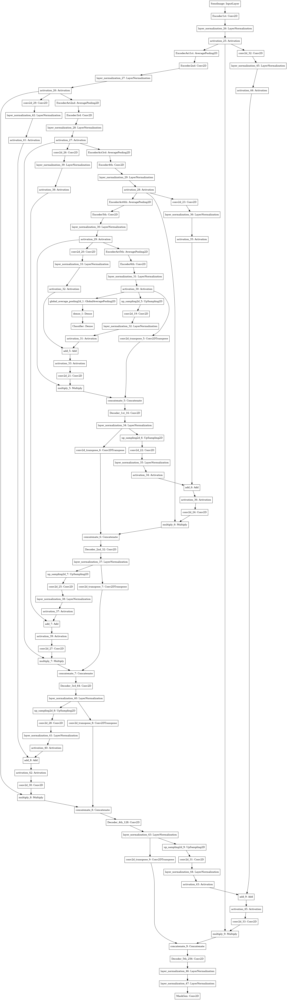

In [13]:
discriminator = get_discriminator()
generator = get_generator()

tf.keras.utils.plot_model(generator)

In [14]:
discriminator.summary()

Model: "Discriminator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
SonoImage (InputLayer)          [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
MaskToDiscriminate (InputLayer) [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
Merging_two_imgs (Concatenate)  (None, 128, 128, 4)  0           SonoImage[0][0]                  
                                                                 MaskToDiscriminate[0][0]         
__________________________________________________________________________________________________
conv2d_15 (Conv2D)              (None, 64, 64, 64)   6464        Merging_two_imgs[0][0

# Training and display
- 데코레이터를 사용하여 train(fit)하고
- 중간중간에 input, GT, predicted mask를 볼 수 있는 함수 작성

Found 156 validated image filenames.
Found 156 validated image filenames.
0.0 0.8431373


2022-09-06 14:53:03.748708: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


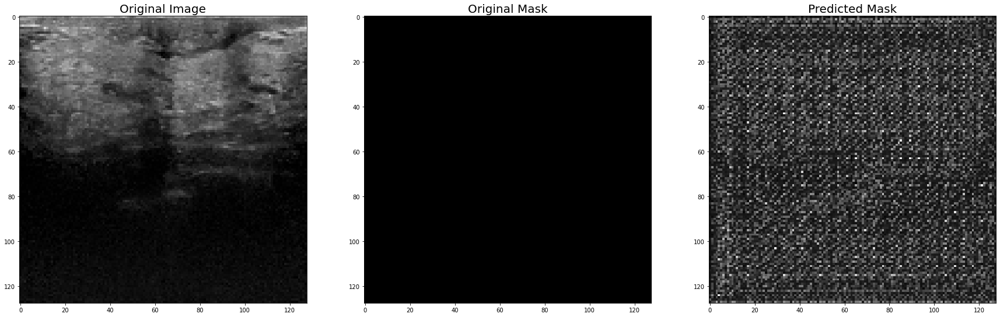

In [15]:
def generate_images(generator, test_input, target):
    pred_mask, pred_label = generator(test_input, training = True)
    pred_mask = tf.squeeze(pred_mask)
    pred_mask = tf.expand_dims(pred_mask, -1)
    pred_mask = ((pred_mask - np.min(pred_mask))/(np.max(pred_mask)-np.min(pred_mask)))
    #pred_mask = np.round(pred_mask)
    
    #print(pred_mask.shape, np.min(pred_mask), np.max(pred_mask))
    
    fig, axes = plt.subplots(1, 3, figsize = (30,10))
    ax = axes.flatten()
    ax[0].imshow(tf.squeeze(test_input))
    ax[0].set_title("Original Image", fontsize = 20)
    ax[1].imshow(target, cmap = 'gray')
    ax[1].set_title("Original Mask", fontsize = 20)
    ax[2].imshow(pred_mask, cmap = 'gray')
    ax[2].set_title('Predicted Mask', fontsize = 20)
    plt.show()
#curation
for img, (mask, lab) in val_whole_ds.take(1):
    test_input = tf.expand_dims(img[0], 0)
    test_target = mask[0]
print(np.min(test_input), np.max(test_input))
generate_images(generator, test_input, test_target)

> Customized callbacks
- Training 과정을 시각적으로 구현

In [16]:
class show_progress(keras.callbacks.Callback):
    def on_epoch_end(self, epochs, logs = None):
        if epochs % 5 == 0:
            print("On Training data...", "\n")
            for _ in range(3):
                for img, (mask, lab) in train_whole_ds.take(1):
                    test_input = tf.expand_dims(img[0], 0)
                    test_target = mask[0]
                    generate_images(self.model, test_input, test_target)
            print("On validation data...", "\n")
            for _ in range(3):
                for img, (mask, lab) in val_whole_ds.take(1):
                    test_input = tf.expand_dims(img[0], 0)
                    test_target = mask[0]
                    generate_images(self.model, test_input, test_target)

# Training
- 일반적인 U-net architecture + classifier head 
- Pix2Pix GAN

Epoch 1/100
Found 624 validated image filenames.
Found 624 validated image filenames.
62/62 [==============================] - ETA: 0s - loss: 1.1334 - MaskGen_loss: 0.0740 - Classifier_loss: 1.0594Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 42s 532ms/step - loss: 1.1334 - MaskGen_loss: 0.0740 - Classifier_loss: 1.0594 - val_loss: 1.1087 - val_MaskGen_loss: 0.0659 - val_Classifier_loss: 1.0429


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


On Training data... 

Found 624 validated image filenames.
Found 624 validated image filenames.


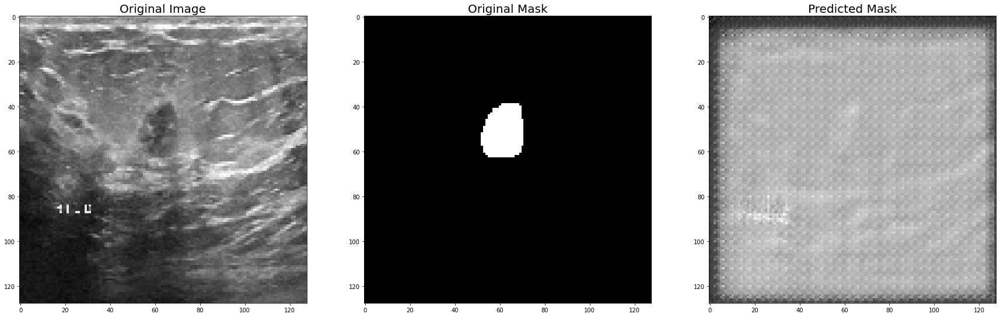

Found 624 validated image filenames.
Found 624 validated image filenames.


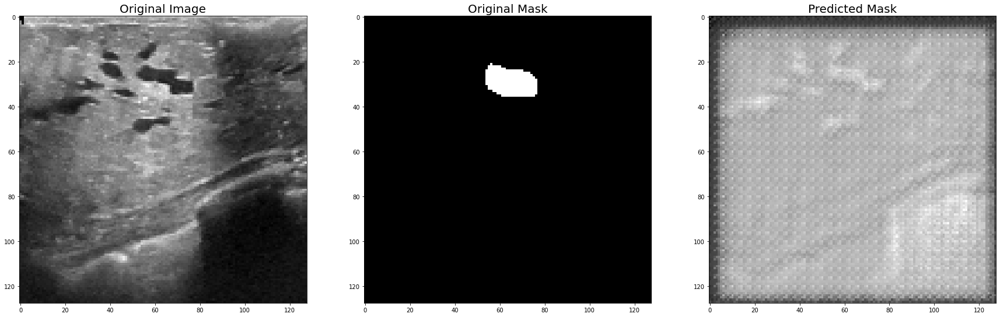

Found 624 validated image filenames.
Found 624 validated image filenames.


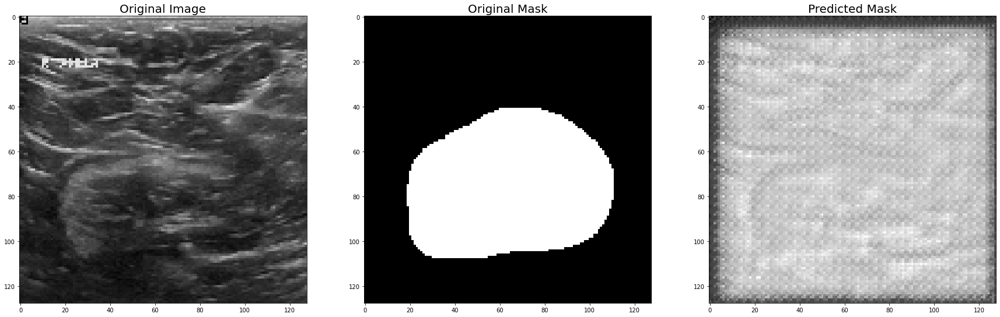

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


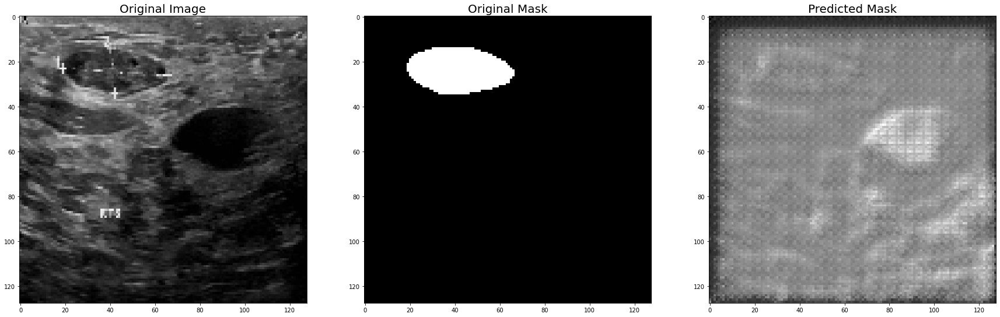

Found 156 validated image filenames.
Found 156 validated image filenames.


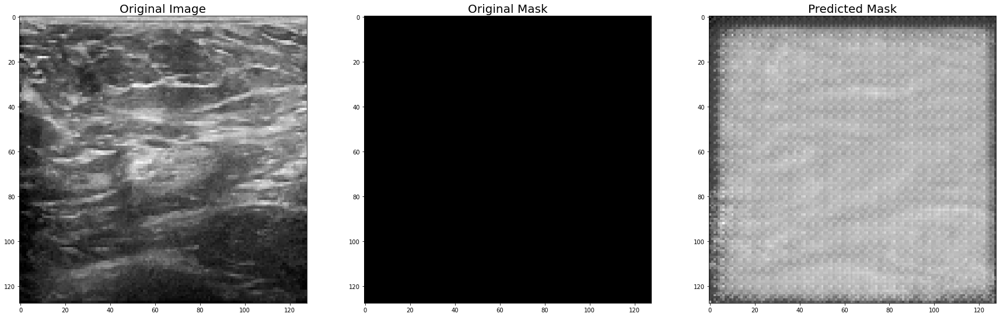

Found 156 validated image filenames.
Found 156 validated image filenames.


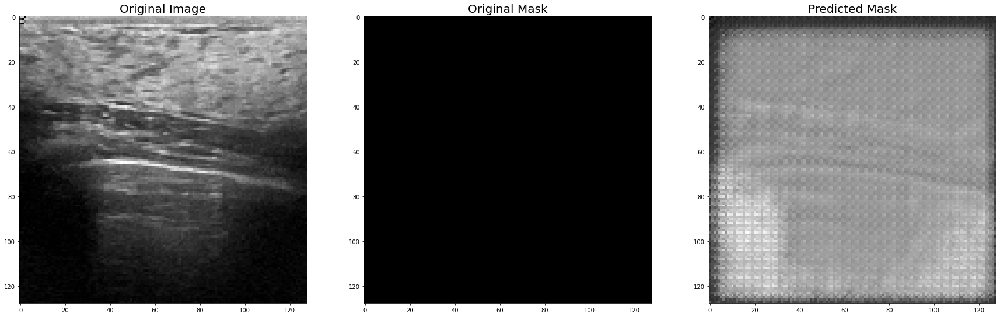

Epoch 2/100
62/62 [==============================] - ETA: 0s - loss: 1.1016 - MaskGen_loss: 0.0700 - Classifier_loss: 1.0316Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 22s 339ms/step - loss: 1.1016 - MaskGen_loss: 0.0700 - Classifier_loss: 1.0316 - val_loss: 1.1060 - val_MaskGen_loss: 0.0660 - val_Classifier_loss: 1.0400
Epoch 3/100
62/62 [==============================] - ETA: 0s - loss: 1.0871 - MaskGen_loss: 0.0677 - Classifier_loss: 1.0194Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 327ms/step - loss: 1.0871 - MaskGen_loss: 0.0677 - Classifier_loss: 1.0194 - val_loss: 1.0739 - val_MaskGen_loss: 0.0567 - val_Classifier_loss: 1.0171
Epoch 4/100
62/62 [==============================] - ETA: 0s - loss: 1.0710 - MaskGen_loss: 0.0595 - Classifier_loss: 1.0115Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [=======

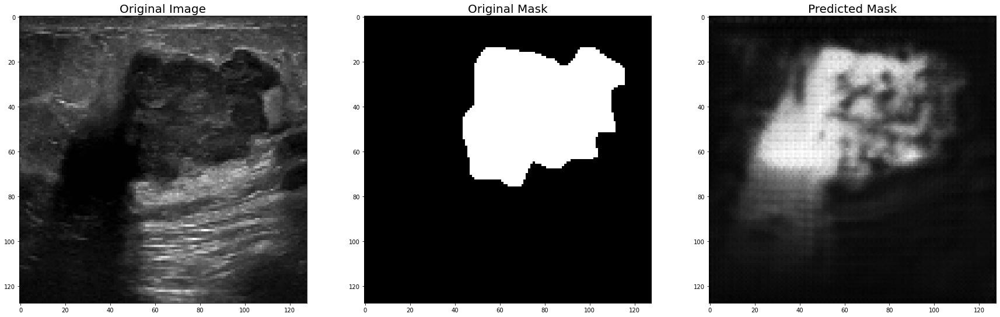

Found 624 validated image filenames.
Found 624 validated image filenames.


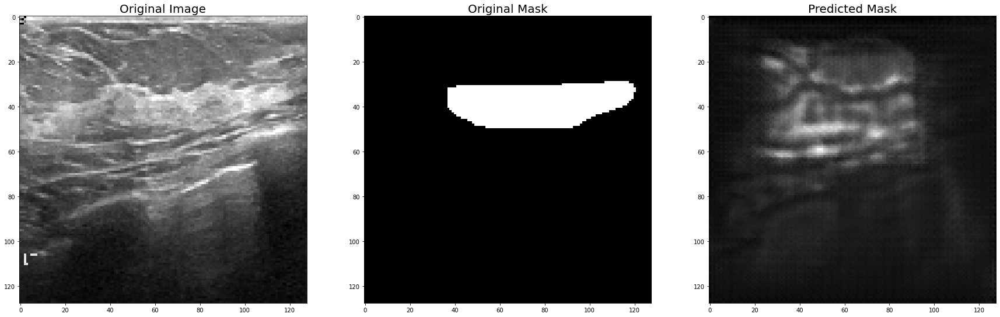

Found 624 validated image filenames.
Found 624 validated image filenames.


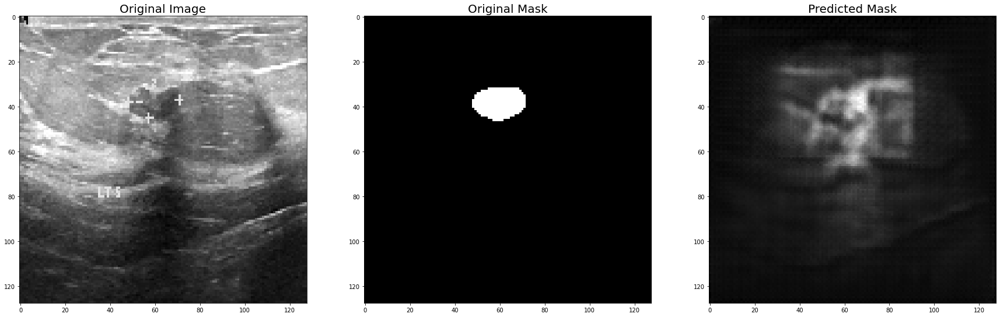

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


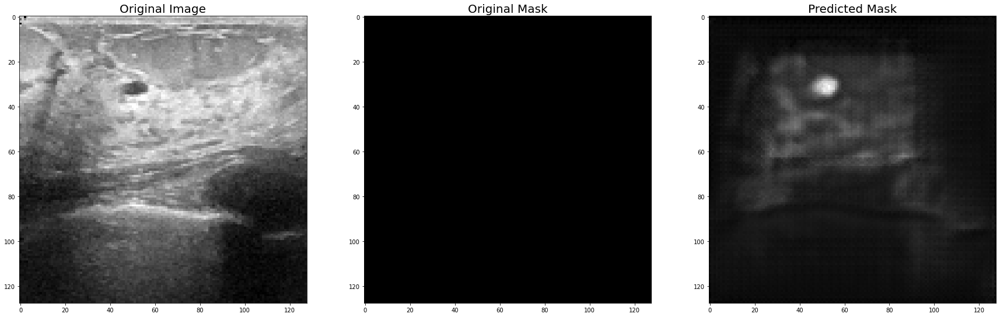

Found 156 validated image filenames.
Found 156 validated image filenames.


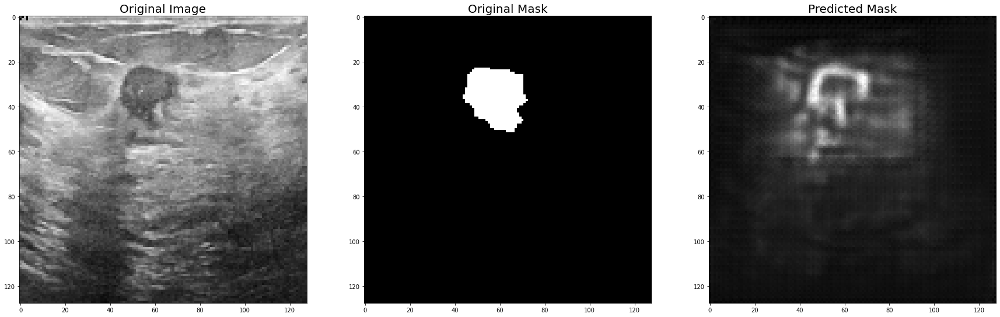

Found 156 validated image filenames.
Found 156 validated image filenames.


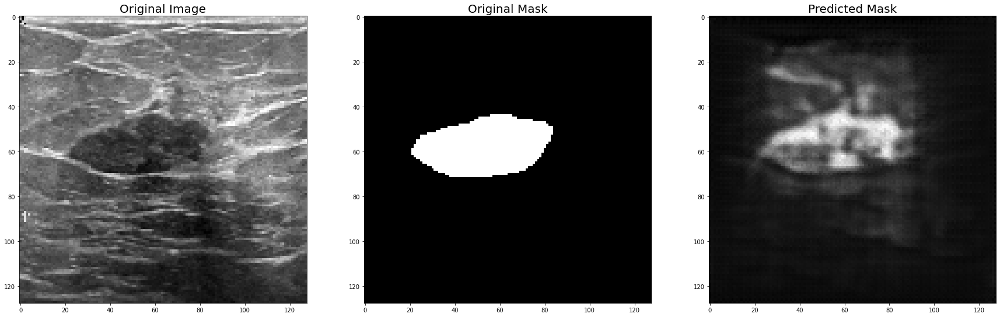

Epoch 7/100
62/62 [==============================] - ETA: 0s - loss: 1.0477 - MaskGen_loss: 0.0552 - Classifier_loss: 0.9925Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 21s 343ms/step - loss: 1.0477 - MaskGen_loss: 0.0552 - Classifier_loss: 0.9925 - val_loss: 1.0517 - val_MaskGen_loss: 0.0539 - val_Classifier_loss: 0.9978
Epoch 8/100
62/62 [==============================] - ETA: 0s - loss: 1.0406 - MaskGen_loss: 0.0539 - Classifier_loss: 0.9867Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 328ms/step - loss: 1.0406 - MaskGen_loss: 0.0539 - Classifier_loss: 0.9867 - val_loss: 1.0514 - val_MaskGen_loss: 0.0535 - val_Classifier_loss: 0.9979
Epoch 9/100
62/62 [==============================] - ETA: 0s - loss: 1.0402 - MaskGen_loss: 0.0533 - Classifier_loss: 0.9869Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [=======

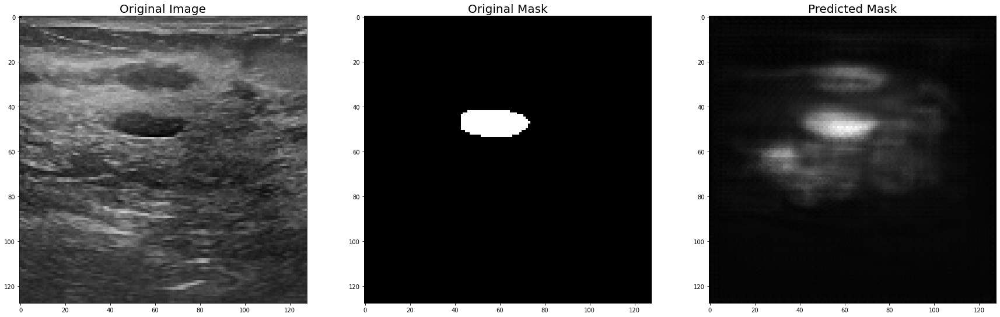

Found 624 validated image filenames.
Found 624 validated image filenames.


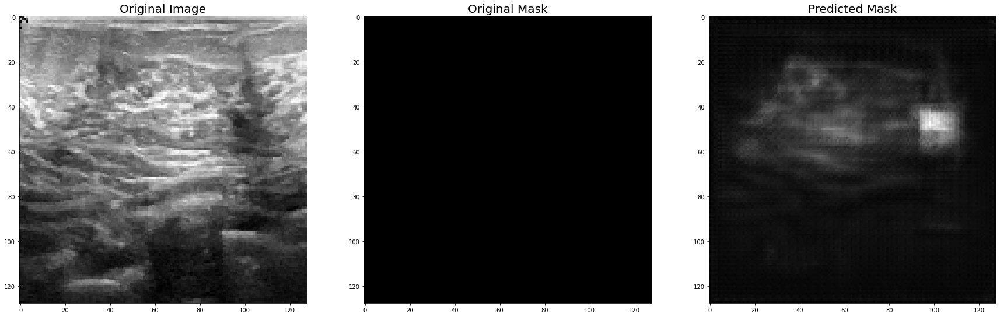

Found 624 validated image filenames.
Found 624 validated image filenames.


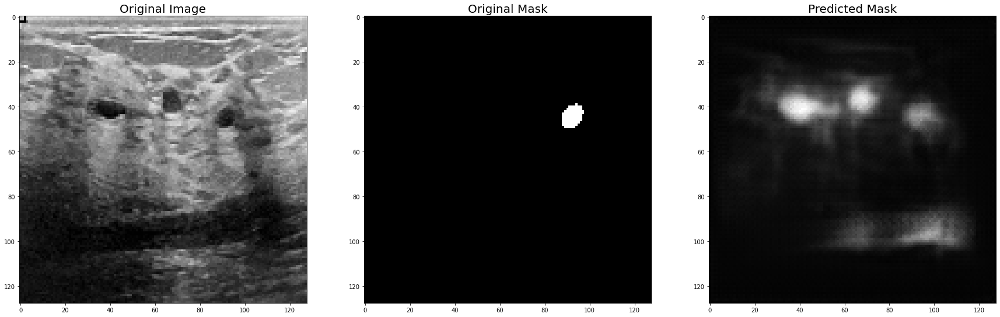

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


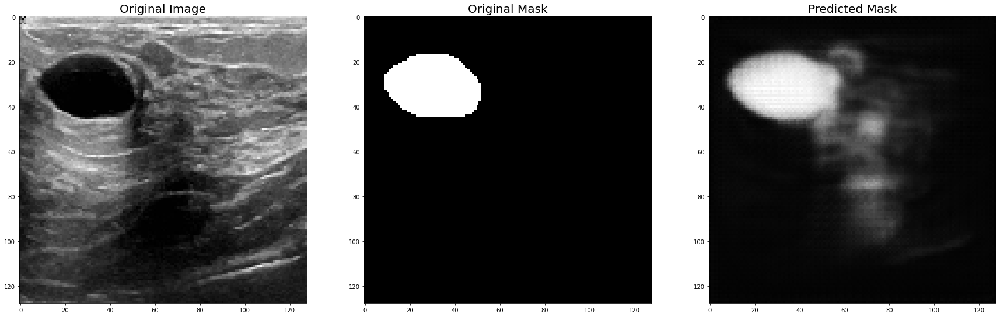

Found 156 validated image filenames.
Found 156 validated image filenames.


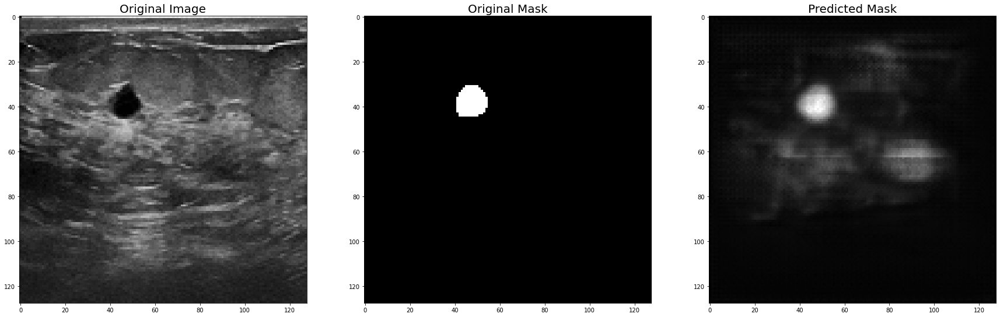

Found 156 validated image filenames.
Found 156 validated image filenames.


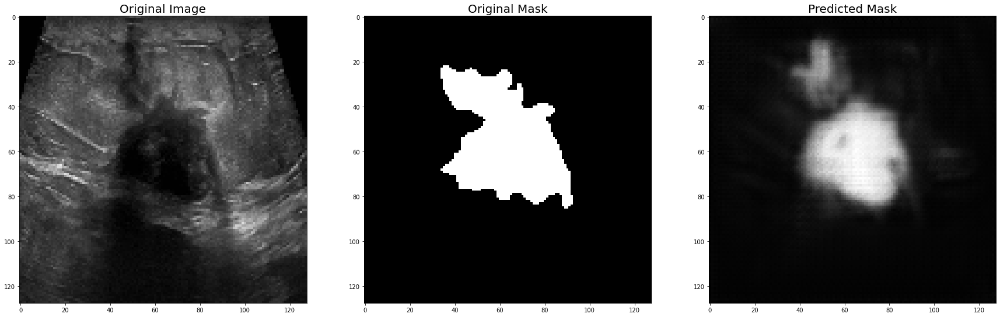

Epoch 12/100
62/62 [==============================] - ETA: 0s - loss: 1.0328 - MaskGen_loss: 0.0492 - Classifier_loss: 0.9837Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 320ms/step - loss: 1.0328 - MaskGen_loss: 0.0492 - Classifier_loss: 0.9837 - val_loss: 1.0233 - val_MaskGen_loss: 0.0466 - val_Classifier_loss: 0.9767
Epoch 13/100
62/62 [==============================] - ETA: 0s - loss: 1.0239 - MaskGen_loss: 0.0471 - Classifier_loss: 0.9768Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 323ms/step - loss: 1.0239 - MaskGen_loss: 0.0471 - Classifier_loss: 0.9768 - val_loss: 1.0202 - val_MaskGen_loss: 0.0479 - val_Classifier_loss: 0.9723
Epoch 14/100
62/62 [==============================] - ETA: 0s - loss: 1.0276 - MaskGen_loss: 0.0466 - Classifier_loss: 0.9809Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

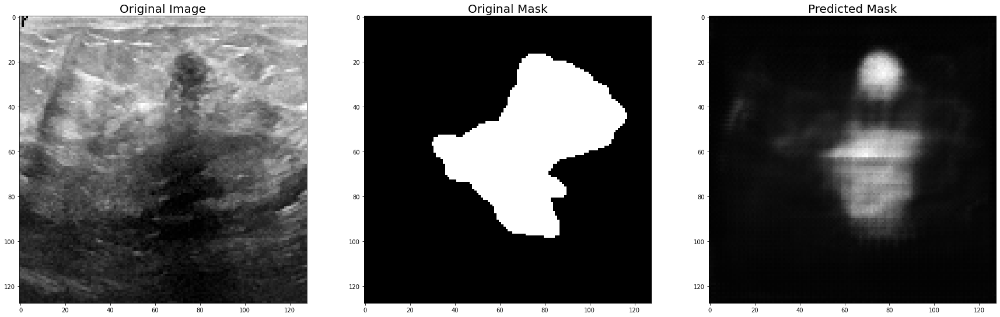

Found 624 validated image filenames.
Found 624 validated image filenames.


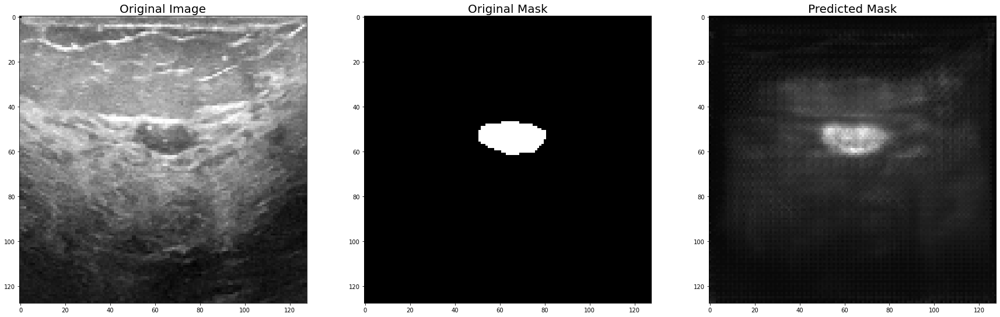

Found 624 validated image filenames.
Found 624 validated image filenames.


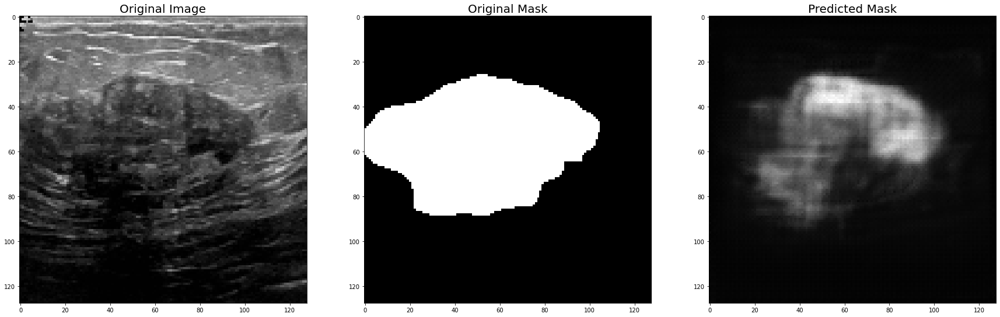

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


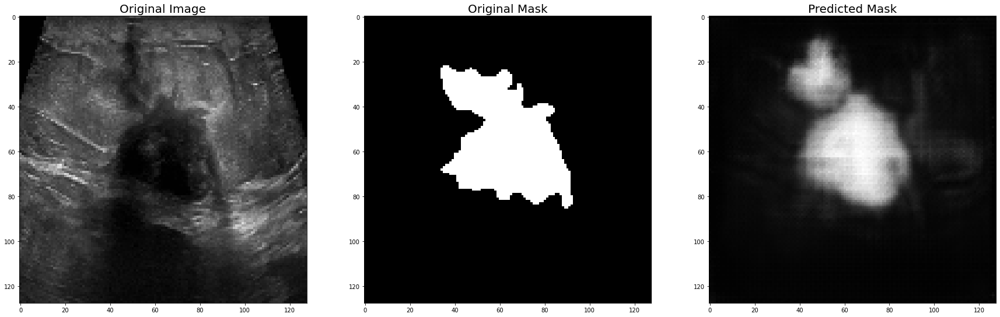

Found 156 validated image filenames.
Found 156 validated image filenames.


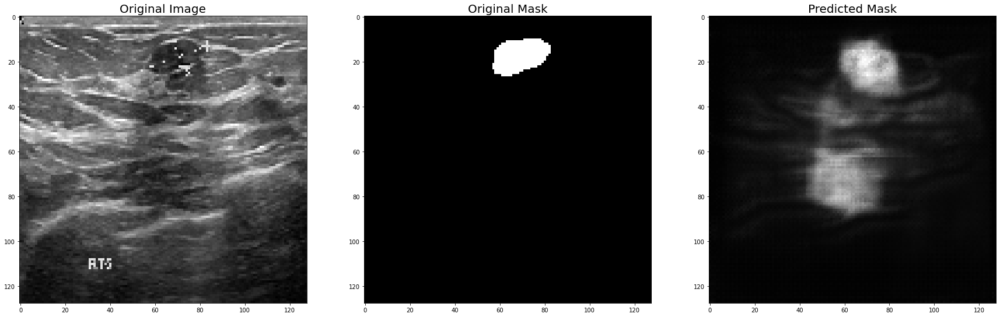

Found 156 validated image filenames.
Found 156 validated image filenames.


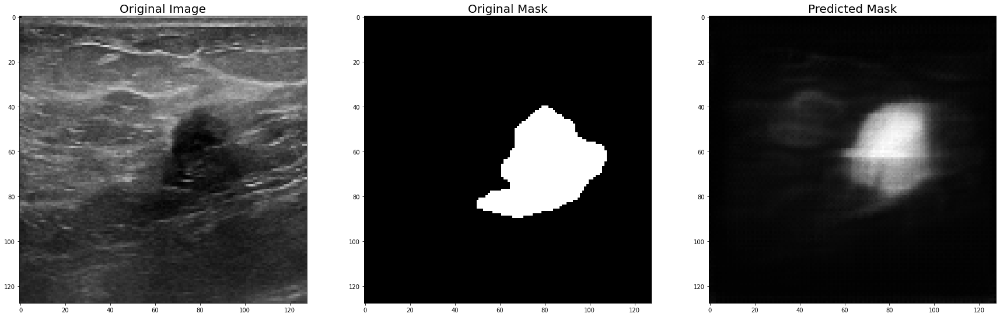

Epoch 17/100
62/62 [==============================] - ETA: 0s - loss: 1.1924 - MaskGen_loss: 0.0463 - Classifier_loss: 1.1461Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 19s 314ms/step - loss: 1.1924 - MaskGen_loss: 0.0463 - Classifier_loss: 1.1461 - val_loss: 1.1874 - val_MaskGen_loss: 0.0424 - val_Classifier_loss: 1.1450
Epoch 18/100
62/62 [==============================] - ETA: 0s - loss: 1.1497 - MaskGen_loss: 0.0437 - Classifier_loss: 1.1059Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 323ms/step - loss: 1.1497 - MaskGen_loss: 0.0437 - Classifier_loss: 1.1059 - val_loss: 1.1572 - val_MaskGen_loss: 0.0422 - val_Classifier_loss: 1.1150
Epoch 19/100
62/62 [==============================] - ETA: 0s - loss: 1.1186 - MaskGen_loss: 0.0423 - Classifier_loss: 1.0763Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

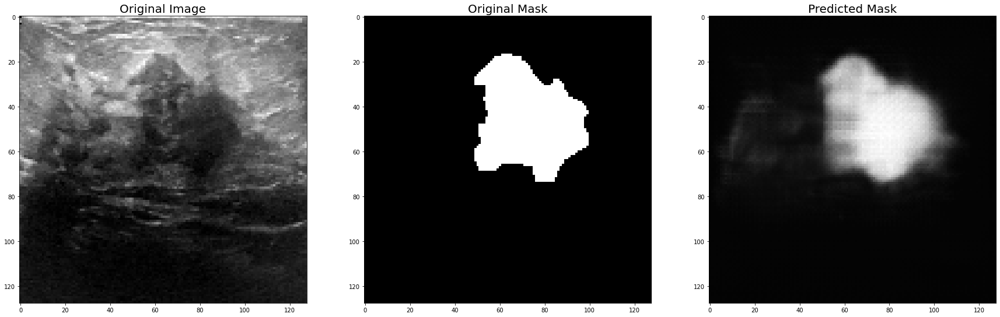

Found 624 validated image filenames.
Found 624 validated image filenames.


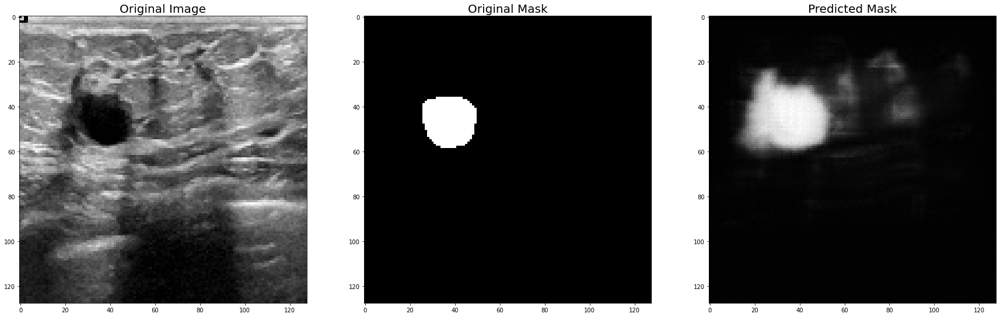

Found 624 validated image filenames.
Found 624 validated image filenames.


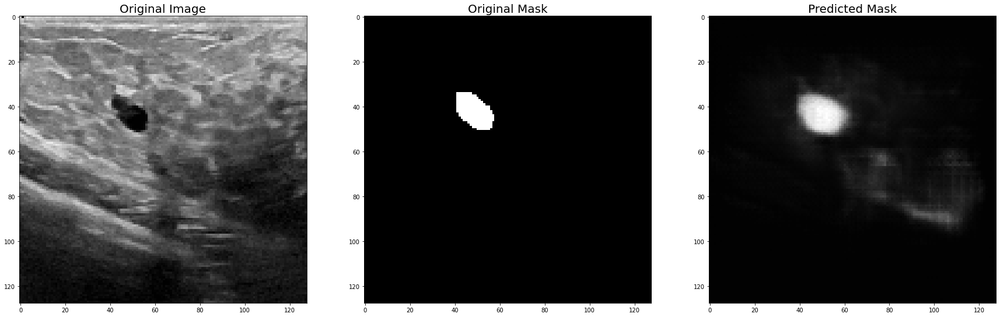

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


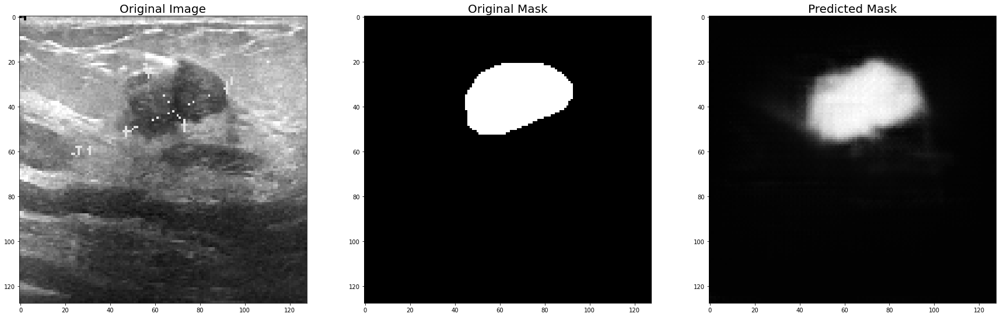

Found 156 validated image filenames.
Found 156 validated image filenames.


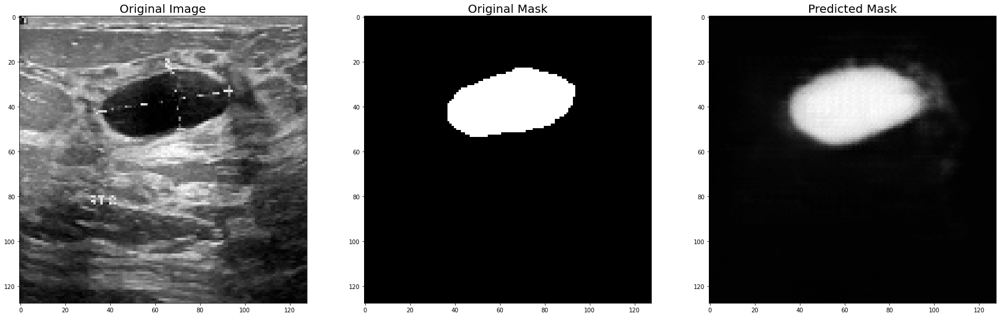

Found 156 validated image filenames.
Found 156 validated image filenames.


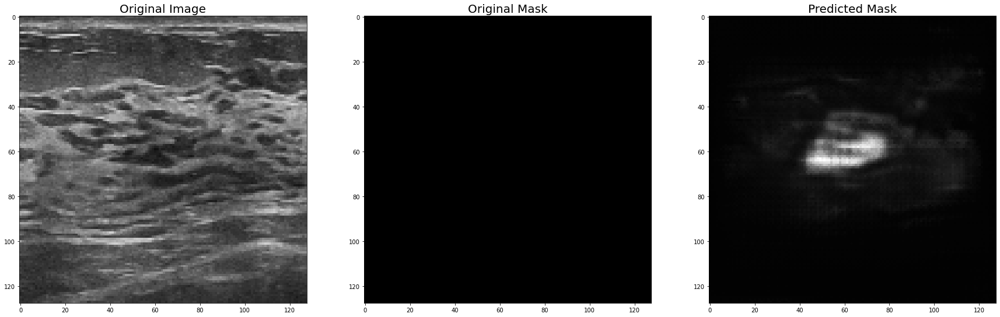

Epoch 22/100
62/62 [==============================] - ETA: 0s - loss: 1.0613 - MaskGen_loss: 0.0391 - Classifier_loss: 1.0222Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 317ms/step - loss: 1.0613 - MaskGen_loss: 0.0391 - Classifier_loss: 1.0222 - val_loss: 1.0748 - val_MaskGen_loss: 0.0386 - val_Classifier_loss: 1.0362
Epoch 23/100
62/62 [==============================] - ETA: 0s - loss: 1.0516 - MaskGen_loss: 0.0380 - Classifier_loss: 1.0136Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 315ms/step - loss: 1.0516 - MaskGen_loss: 0.0380 - Classifier_loss: 1.0136 - val_loss: 1.0705 - val_MaskGen_loss: 0.0379 - val_Classifier_loss: 1.0326
Epoch 24/100
62/62 [==============================] - ETA: 0s - loss: 1.0435 - MaskGen_loss: 0.0378 - Classifier_loss: 1.0057Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

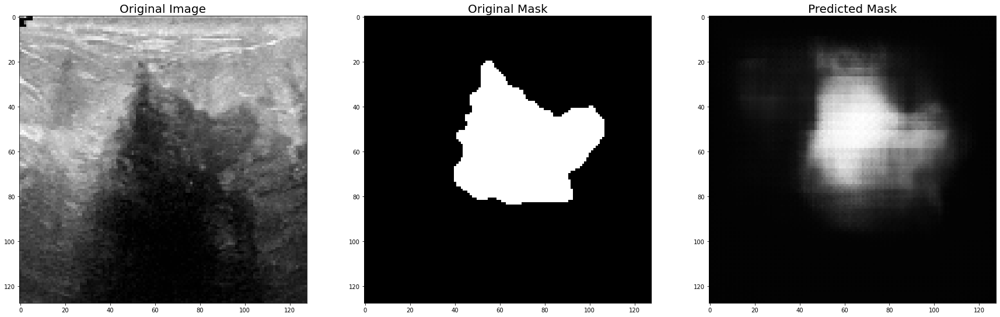

Found 624 validated image filenames.
Found 624 validated image filenames.


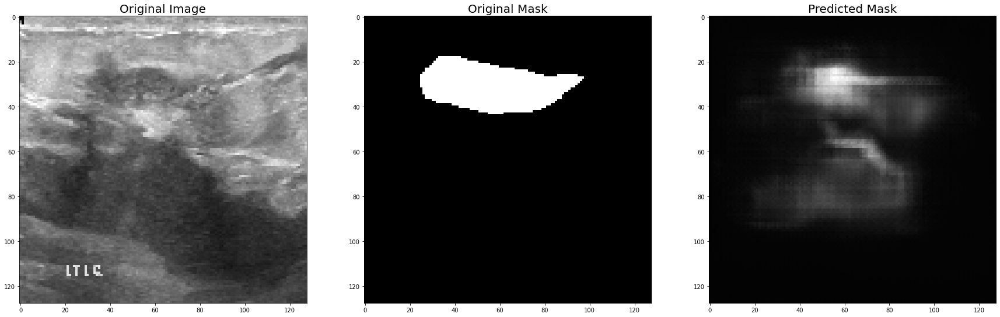

Found 624 validated image filenames.
Found 624 validated image filenames.


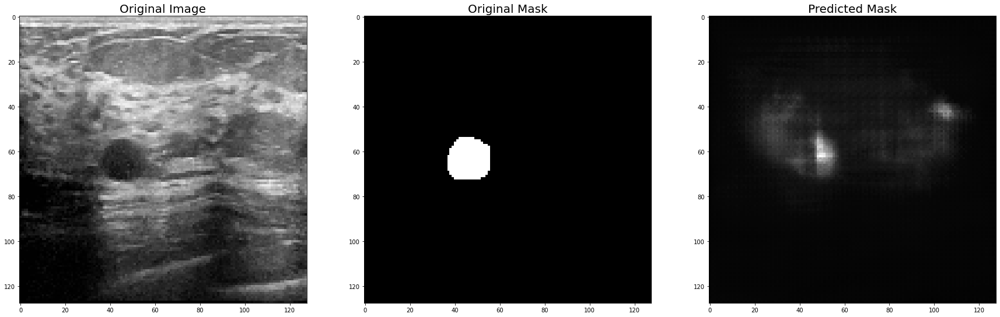

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


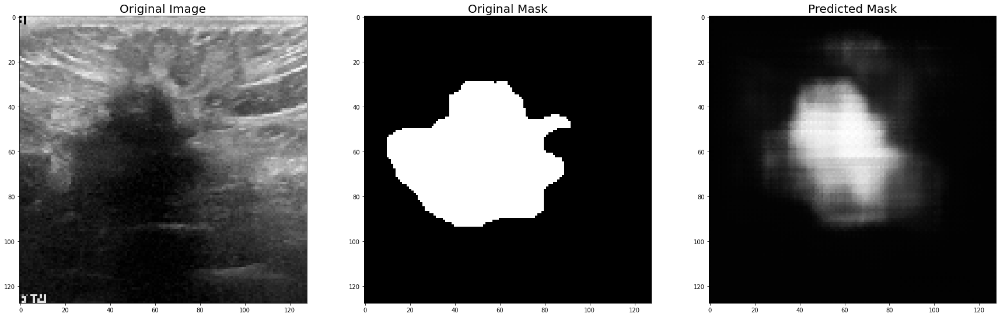

Found 156 validated image filenames.
Found 156 validated image filenames.


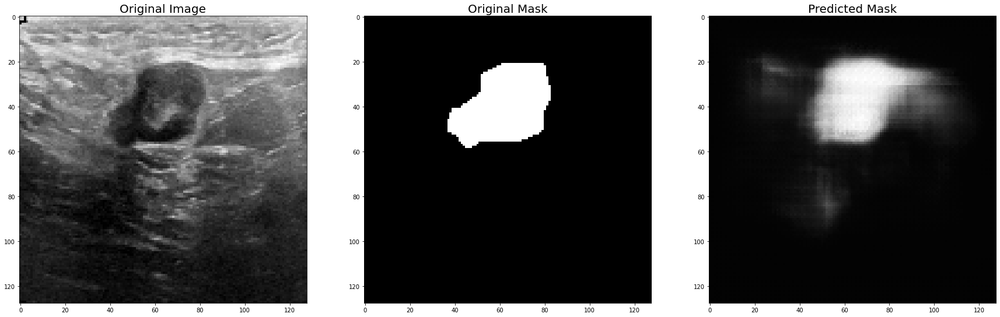

Found 156 validated image filenames.
Found 156 validated image filenames.


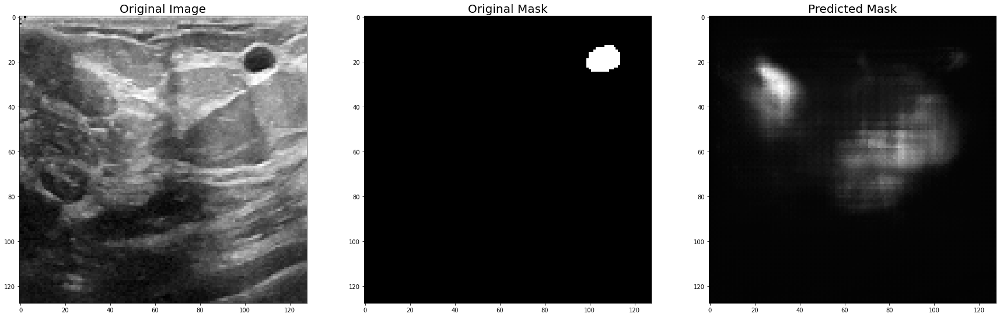

Epoch 27/100
62/62 [==============================] - ETA: 0s - loss: 1.0268 - MaskGen_loss: 0.0361 - Classifier_loss: 0.9907Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 320ms/step - loss: 1.0268 - MaskGen_loss: 0.0361 - Classifier_loss: 0.9907 - val_loss: 1.0509 - val_MaskGen_loss: 0.0388 - val_Classifier_loss: 1.0121
Epoch 28/100
62/62 [==============================] - ETA: 0s - loss: 1.0272 - MaskGen_loss: 0.0350 - Classifier_loss: 0.9923Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 320ms/step - loss: 1.0272 - MaskGen_loss: 0.0350 - Classifier_loss: 0.9923 - val_loss: 1.0330 - val_MaskGen_loss: 0.0373 - val_Classifier_loss: 0.9958
Epoch 29/100
62/62 [==============================] - ETA: 0s - loss: 1.0205 - MaskGen_loss: 0.0335 - Classifier_loss: 0.9870Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

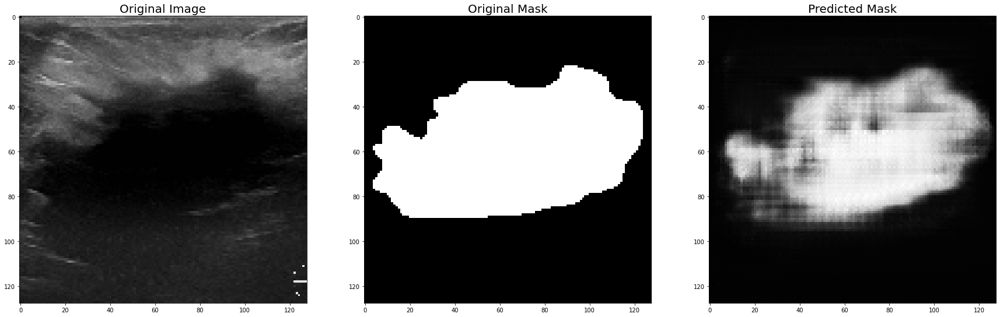

Found 624 validated image filenames.
Found 624 validated image filenames.


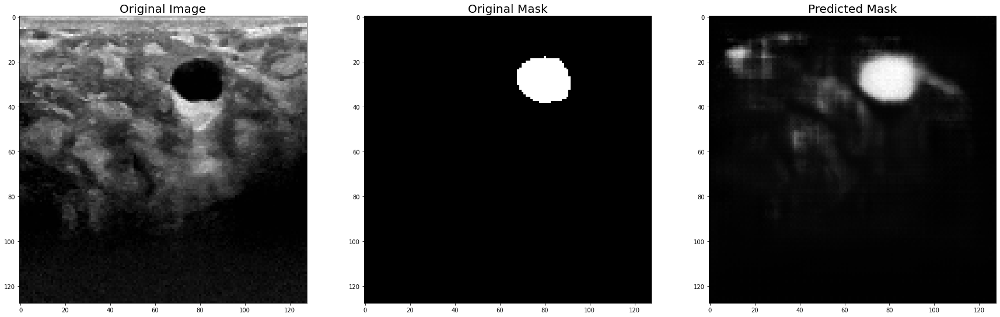

Found 624 validated image filenames.
Found 624 validated image filenames.


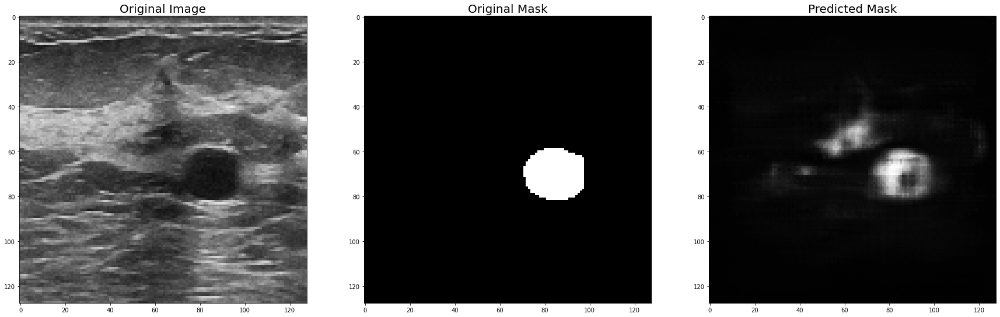

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


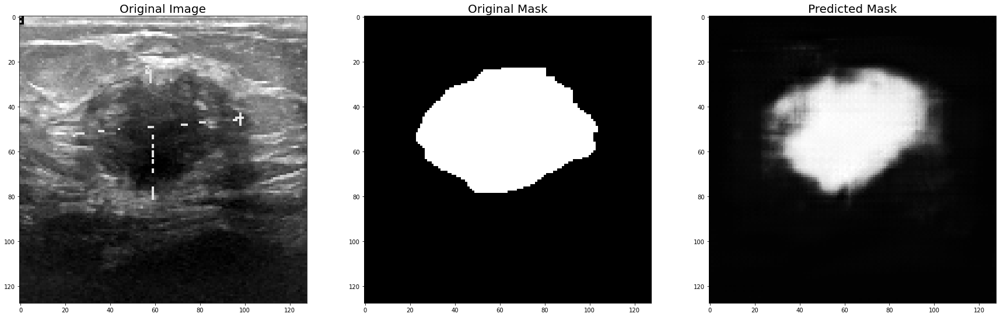

Found 156 validated image filenames.
Found 156 validated image filenames.


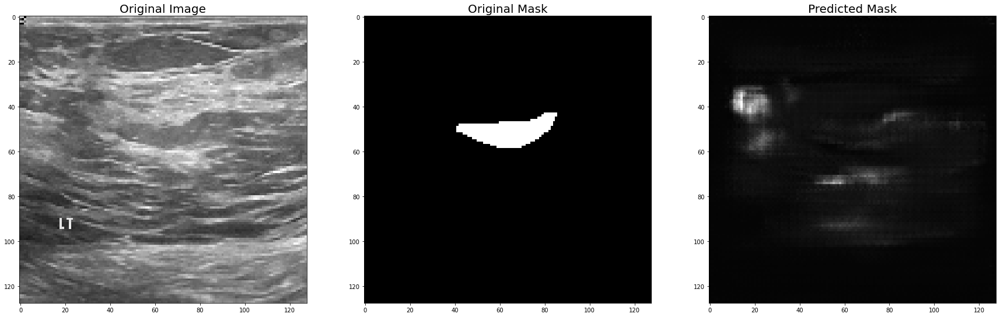

Found 156 validated image filenames.
Found 156 validated image filenames.


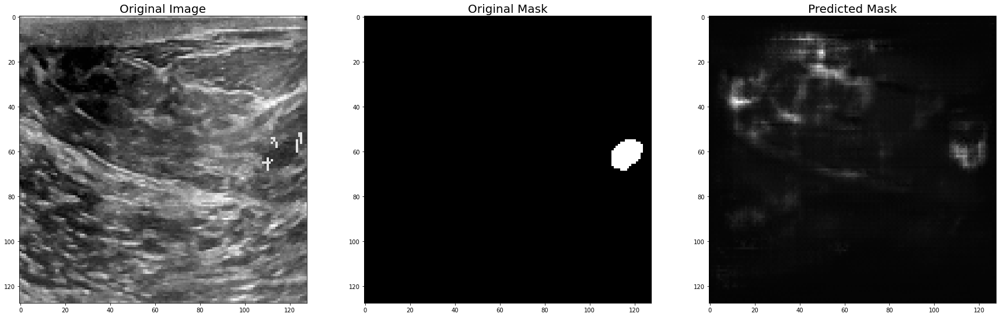

Epoch 32/100
62/62 [==============================] - ETA: 0s - loss: 1.0162 - MaskGen_loss: 0.0322 - Classifier_loss: 0.9840Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 315ms/step - loss: 1.0162 - MaskGen_loss: 0.0322 - Classifier_loss: 0.9840 - val_loss: 1.0247 - val_MaskGen_loss: 0.0385 - val_Classifier_loss: 0.9862
Epoch 33/100
62/62 [==============================] - ETA: 0s - loss: 1.0109 - MaskGen_loss: 0.0309 - Classifier_loss: 0.9800Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 323ms/step - loss: 1.0109 - MaskGen_loss: 0.0309 - Classifier_loss: 0.9800 - val_loss: 1.0335 - val_MaskGen_loss: 0.0403 - val_Classifier_loss: 0.9932
Epoch 34/100
62/62 [==============================] - ETA: 0s - loss: 1.0066 - MaskGen_loss: 0.0290 - Classifier_loss: 0.9776Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

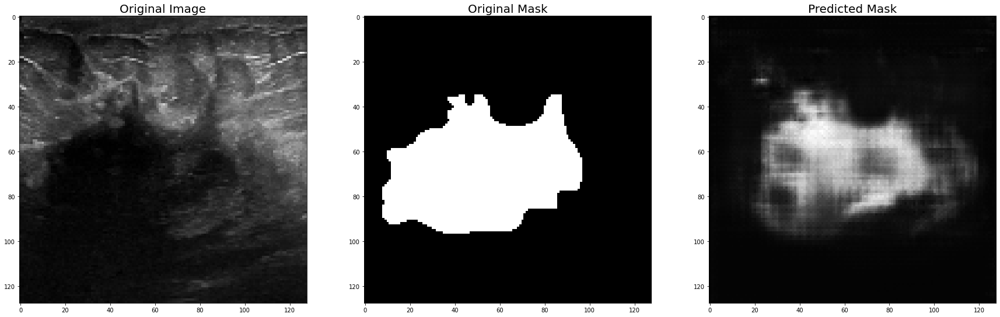

Found 624 validated image filenames.
Found 624 validated image filenames.


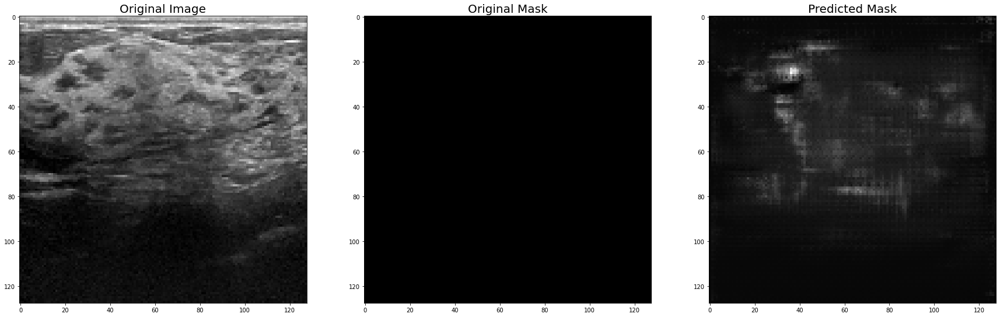

Found 624 validated image filenames.
Found 624 validated image filenames.


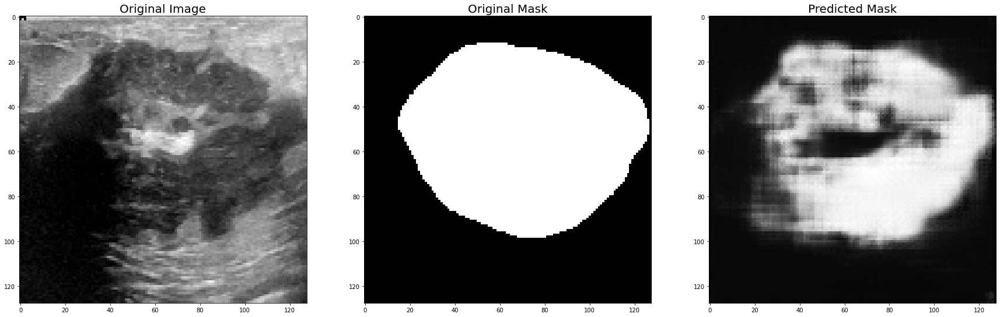

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


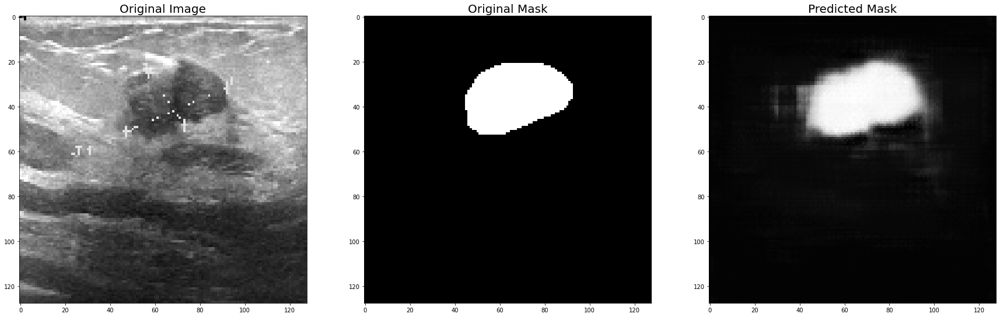

Found 156 validated image filenames.
Found 156 validated image filenames.


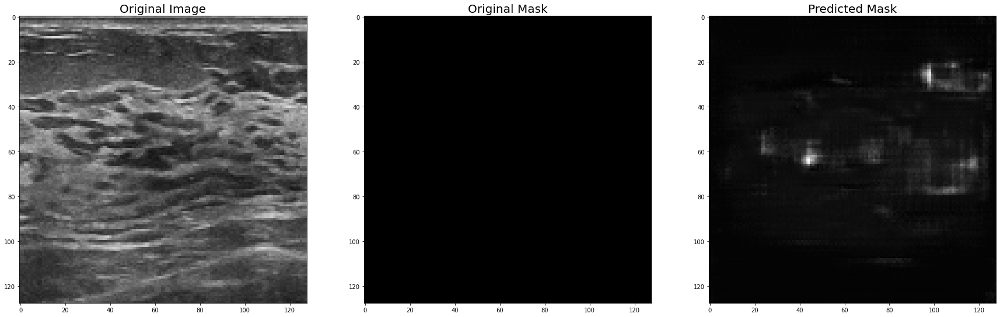

Found 156 validated image filenames.
Found 156 validated image filenames.


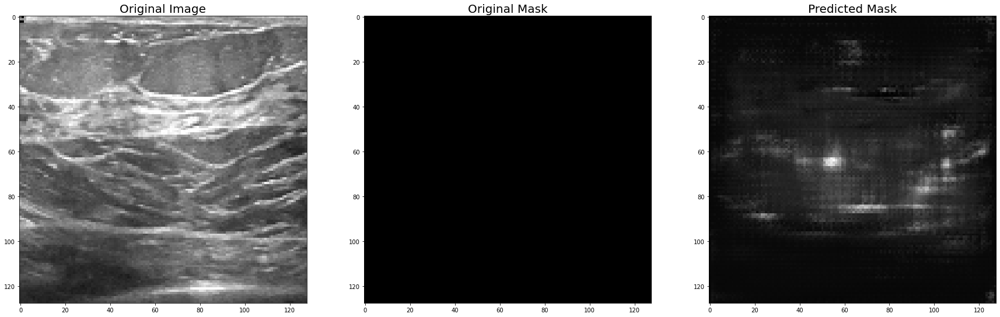

Epoch 37/100
62/62 [==============================] - ETA: 0s - loss: 1.0080 - MaskGen_loss: 0.0266 - Classifier_loss: 0.9814Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 321ms/step - loss: 1.0080 - MaskGen_loss: 0.0266 - Classifier_loss: 0.9814 - val_loss: 1.0215 - val_MaskGen_loss: 0.0353 - val_Classifier_loss: 0.9862
Epoch 38/100
62/62 [==============================] - ETA: 0s - loss: 1.0028 - MaskGen_loss: 0.0256 - Classifier_loss: 0.9772Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 316ms/step - loss: 1.0028 - MaskGen_loss: 0.0256 - Classifier_loss: 0.9772 - val_loss: 1.0179 - val_MaskGen_loss: 0.0362 - val_Classifier_loss: 0.9816
Epoch 39/100
62/62 [==============================] - ETA: 0s - loss: 1.0043 - MaskGen_loss: 0.0254 - Classifier_loss: 0.9790Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

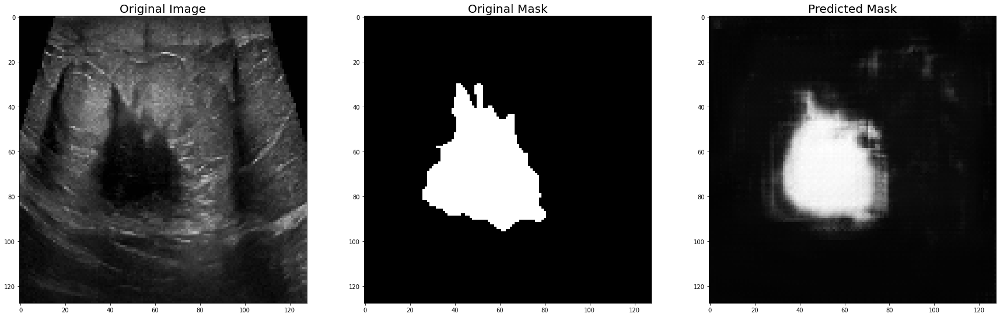

Found 624 validated image filenames.
Found 624 validated image filenames.


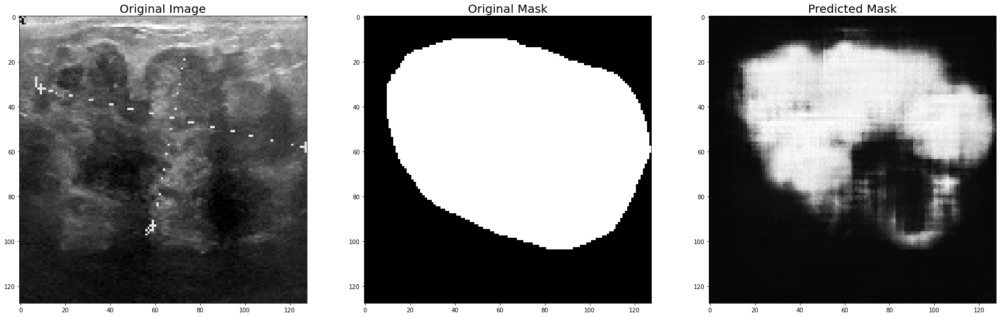

Found 624 validated image filenames.
Found 624 validated image filenames.


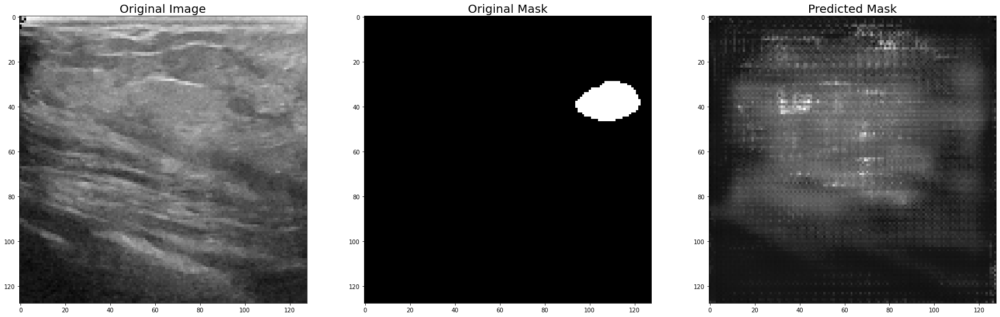

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


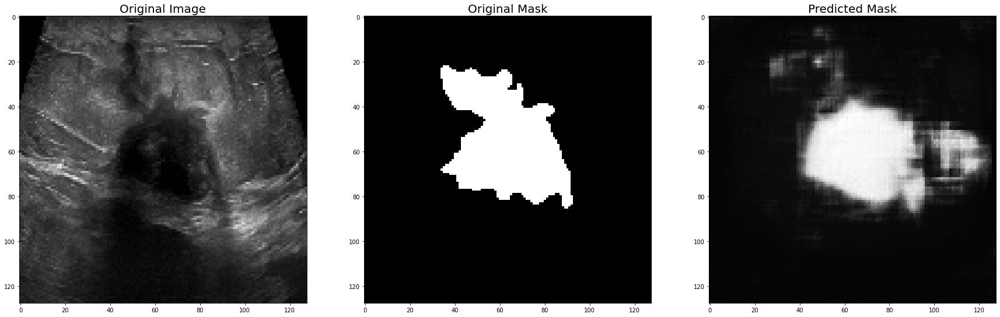

Found 156 validated image filenames.
Found 156 validated image filenames.


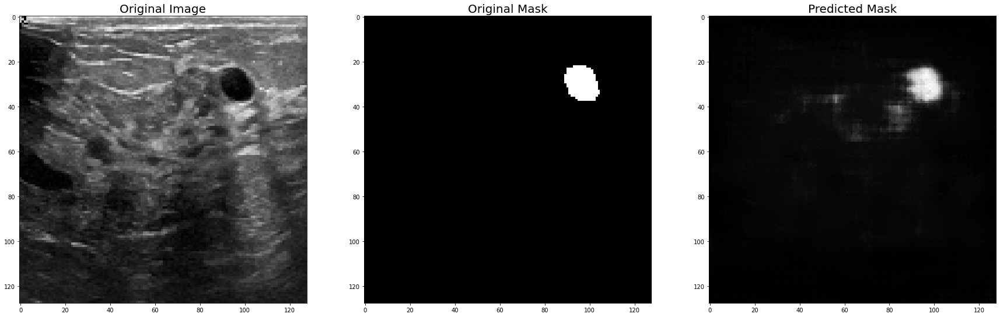

Found 156 validated image filenames.
Found 156 validated image filenames.


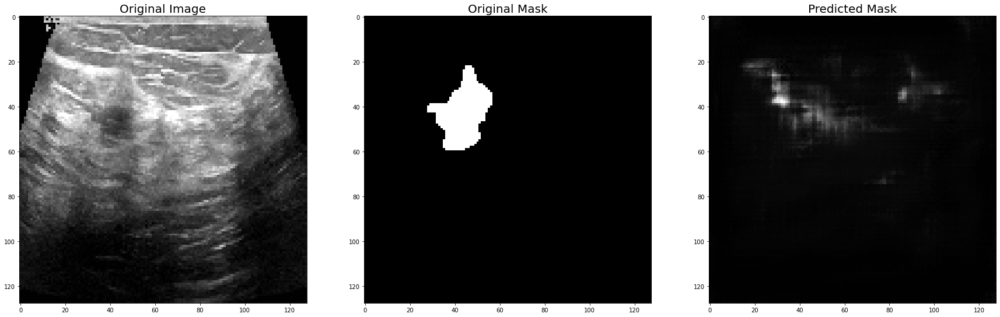

Epoch 42/100
62/62 [==============================] - ETA: 0s - loss: 1.0016 - MaskGen_loss: 0.0239 - Classifier_loss: 0.9777Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 321ms/step - loss: 1.0016 - MaskGen_loss: 0.0239 - Classifier_loss: 0.9777 - val_loss: 1.0274 - val_MaskGen_loss: 0.0427 - val_Classifier_loss: 0.9847
Epoch 43/100
62/62 [==============================] - ETA: 0s - loss: 0.9981 - MaskGen_loss: 0.0224 - Classifier_loss: 0.9756Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 321ms/step - loss: 0.9981 - MaskGen_loss: 0.0224 - Classifier_loss: 0.9756 - val_loss: 1.0109 - val_MaskGen_loss: 0.0393 - val_Classifier_loss: 0.9716
Epoch 44/100
62/62 [==============================] - ETA: 0s - loss: 0.9968 - MaskGen_loss: 0.0232 - Classifier_loss: 0.9736Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

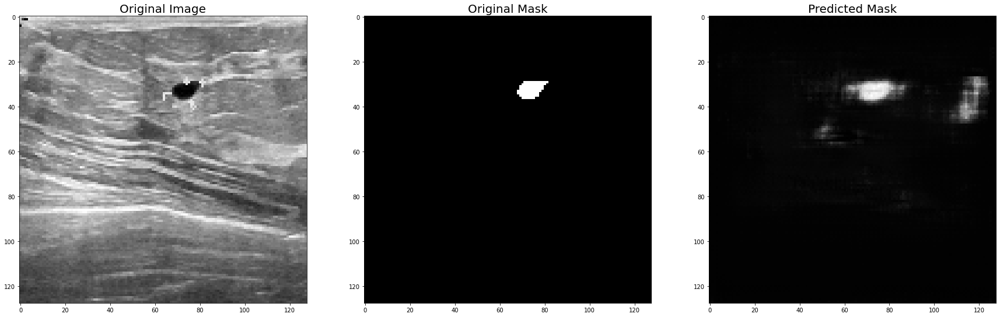

Found 624 validated image filenames.
Found 624 validated image filenames.


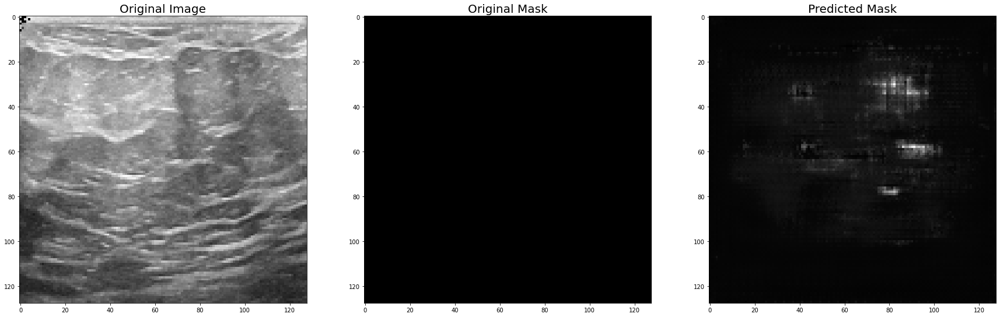

Found 624 validated image filenames.
Found 624 validated image filenames.


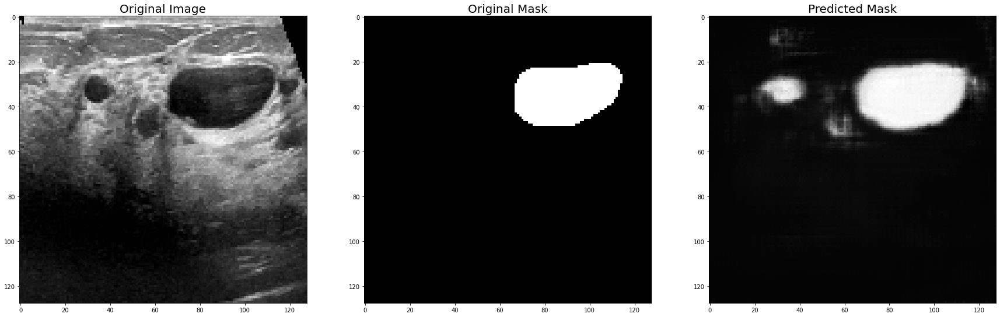

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


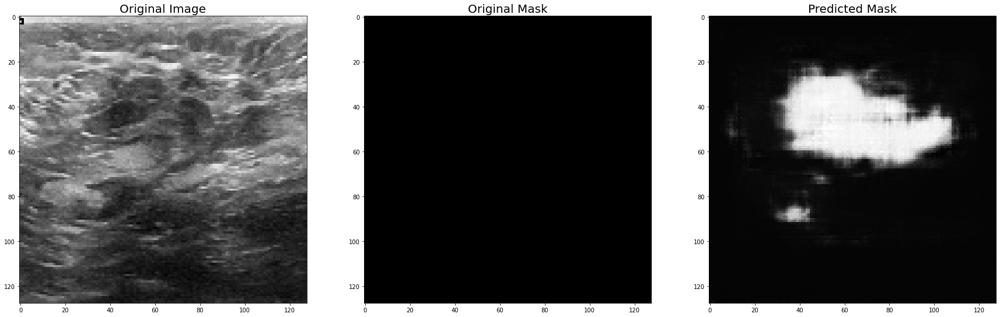

Found 156 validated image filenames.
Found 156 validated image filenames.


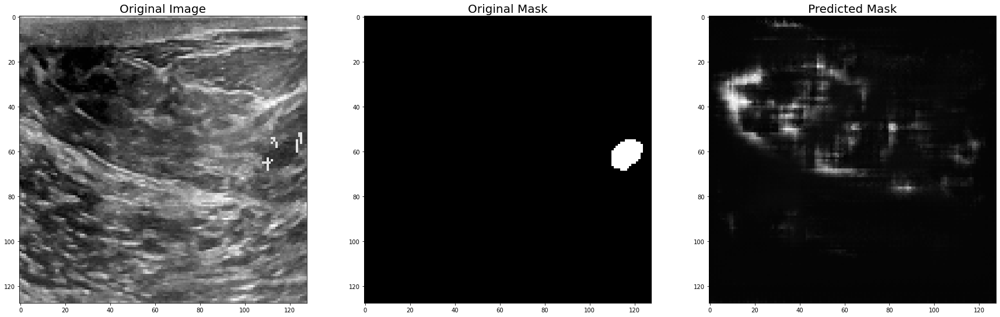

Found 156 validated image filenames.
Found 156 validated image filenames.


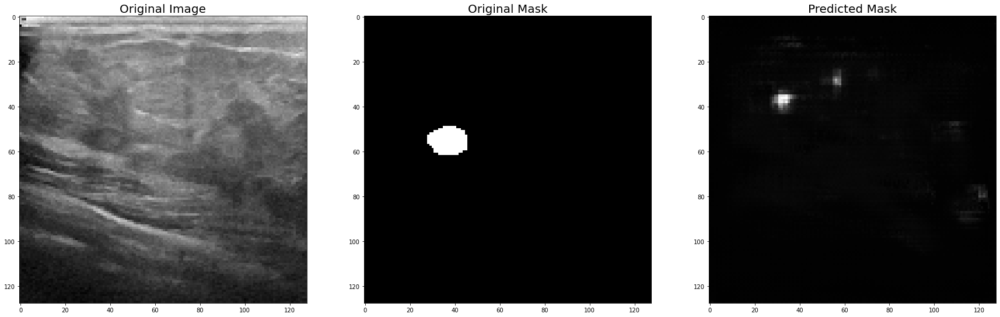

Epoch 47/100
62/62 [==============================] - ETA: 0s - loss: 1.0031 - MaskGen_loss: 0.0213 - Classifier_loss: 0.9818Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 317ms/step - loss: 1.0031 - MaskGen_loss: 0.0213 - Classifier_loss: 0.9818 - val_loss: 1.0198 - val_MaskGen_loss: 0.0453 - val_Classifier_loss: 0.9745
Epoch 48/100
62/62 [==============================] - ETA: 0s - loss: 1.0005 - MaskGen_loss: 0.0209 - Classifier_loss: 0.9795Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 319ms/step - loss: 1.0005 - MaskGen_loss: 0.0209 - Classifier_loss: 0.9795 - val_loss: 1.0387 - val_MaskGen_loss: 0.0467 - val_Classifier_loss: 0.9920
Epoch 49/100
62/62 [==============================] - ETA: 0s - loss: 0.9987 - MaskGen_loss: 0.0203 - Classifier_loss: 0.9784Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

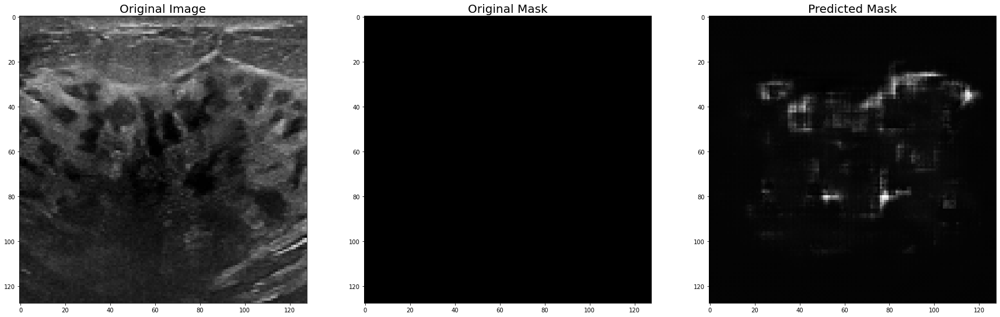

Found 624 validated image filenames.
Found 624 validated image filenames.


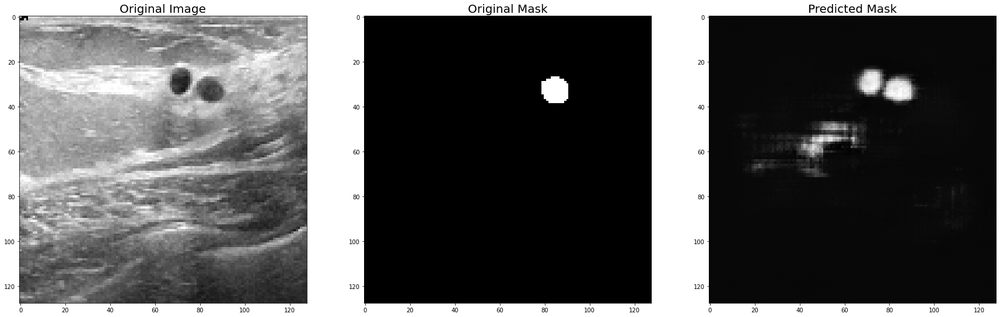

Found 624 validated image filenames.
Found 624 validated image filenames.


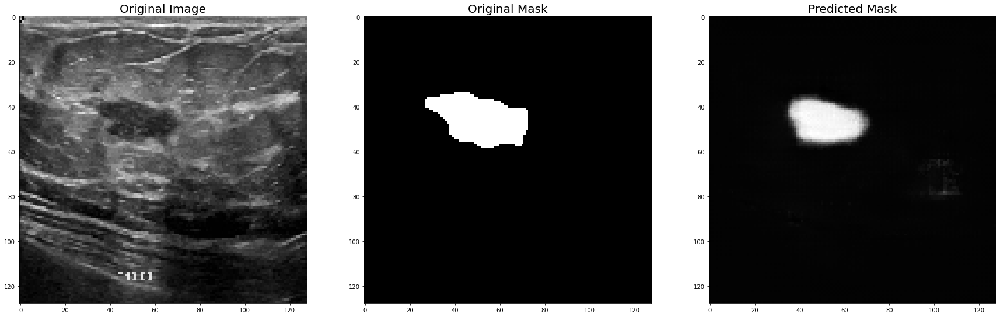

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


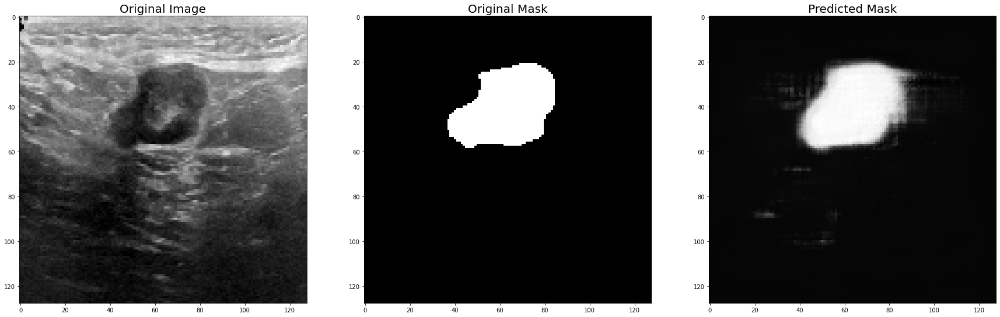

Found 156 validated image filenames.
Found 156 validated image filenames.


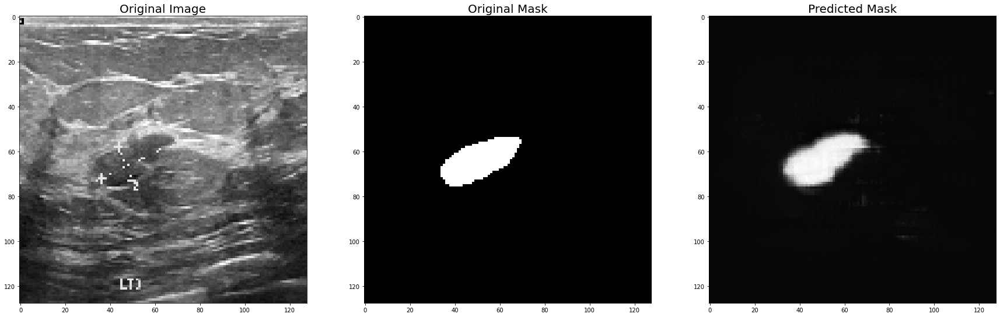

Found 156 validated image filenames.
Found 156 validated image filenames.


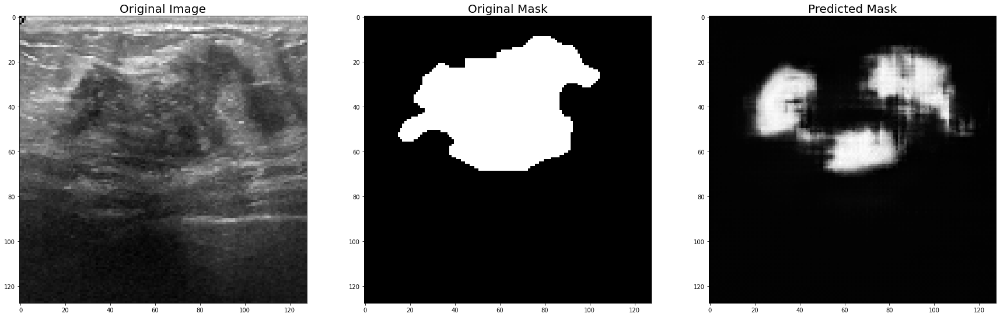

Epoch 52/100
62/62 [==============================] - ETA: 0s - loss: 0.9981 - MaskGen_loss: 0.0186 - Classifier_loss: 0.9795Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 327ms/step - loss: 0.9981 - MaskGen_loss: 0.0186 - Classifier_loss: 0.9795 - val_loss: 1.0272 - val_MaskGen_loss: 0.0390 - val_Classifier_loss: 0.9882
Epoch 53/100
62/62 [==============================] - ETA: 0s - loss: 0.9976 - MaskGen_loss: 0.0184 - Classifier_loss: 0.9792Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 316ms/step - loss: 0.9976 - MaskGen_loss: 0.0184 - Classifier_loss: 0.9792 - val_loss: 1.0250 - val_MaskGen_loss: 0.0402 - val_Classifier_loss: 0.9848
Epoch 54/100
62/62 [==============================] - ETA: 0s - loss: 0.9934 - MaskGen_loss: 0.0171 - Classifier_loss: 0.9763Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

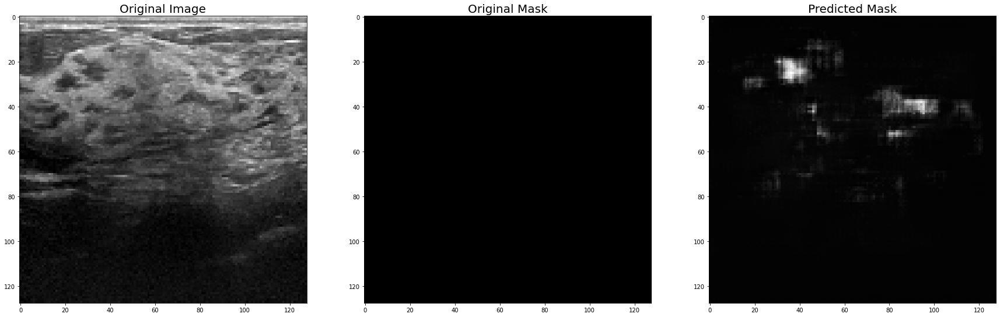

Found 624 validated image filenames.
Found 624 validated image filenames.


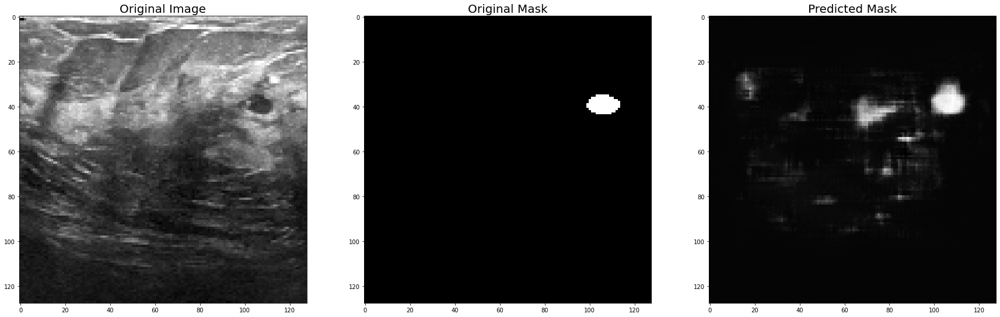

Found 624 validated image filenames.
Found 624 validated image filenames.


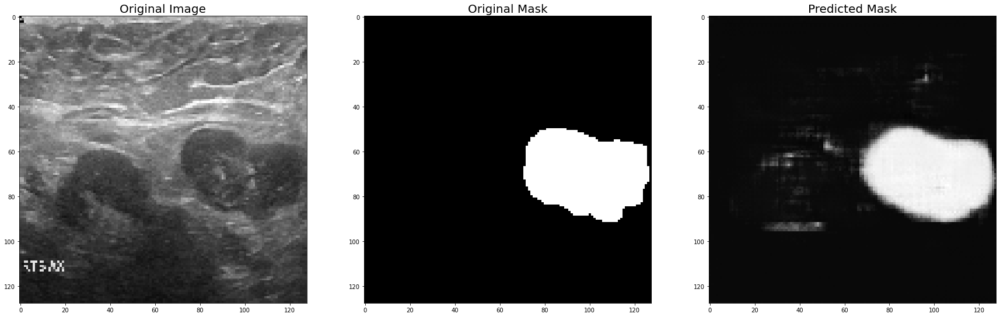

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


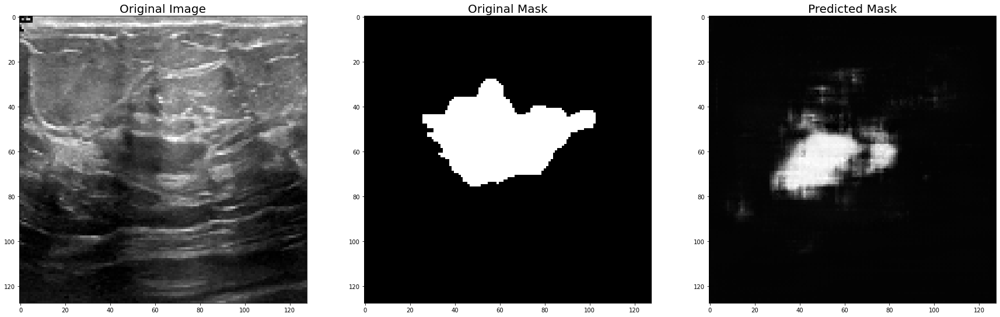

Found 156 validated image filenames.
Found 156 validated image filenames.


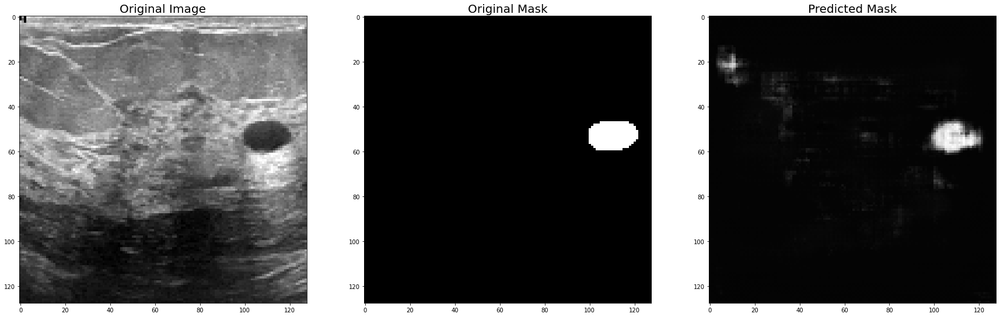

Found 156 validated image filenames.
Found 156 validated image filenames.


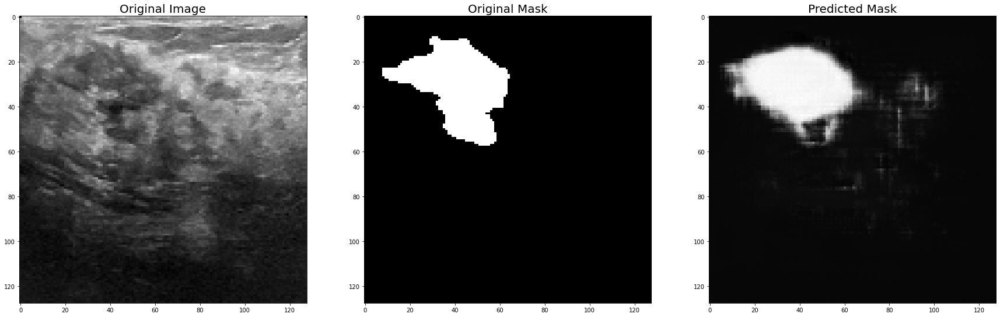

Epoch 57/100
62/62 [==============================] - ETA: 0s - loss: 0.9965 - MaskGen_loss: 0.0134 - Classifier_loss: 0.9830Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 318ms/step - loss: 0.9965 - MaskGen_loss: 0.0134 - Classifier_loss: 0.9830 - val_loss: 1.0156 - val_MaskGen_loss: 0.0357 - val_Classifier_loss: 0.9799
Epoch 58/100
62/62 [==============================] - ETA: 0s - loss: 0.9881 - MaskGen_loss: 0.0126 - Classifier_loss: 0.9755Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 318ms/step - loss: 0.9881 - MaskGen_loss: 0.0126 - Classifier_loss: 0.9755 - val_loss: 1.0302 - val_MaskGen_loss: 0.0373 - val_Classifier_loss: 0.9929
Epoch 59/100
62/62 [==============================] - ETA: 0s - loss: 0.9904 - MaskGen_loss: 0.0129 - Classifier_loss: 0.9775Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

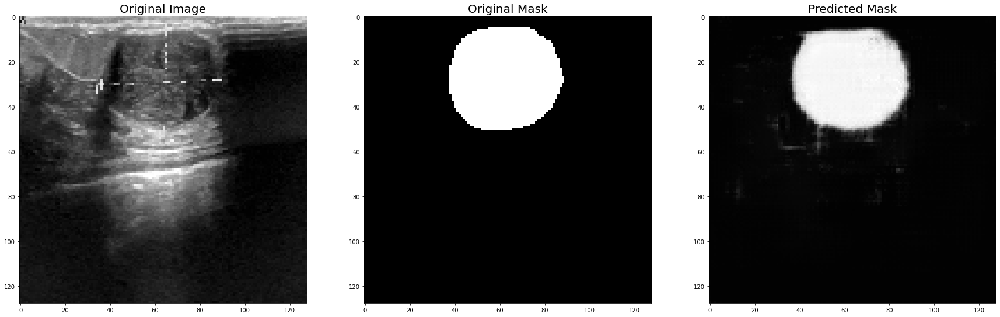

Found 624 validated image filenames.
Found 624 validated image filenames.


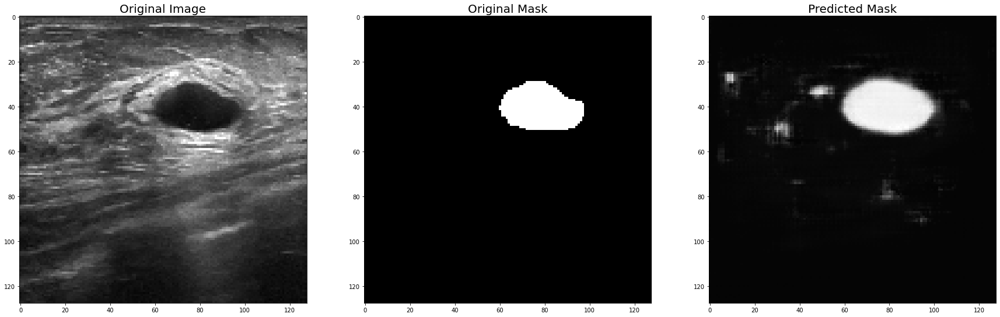

Found 624 validated image filenames.
Found 624 validated image filenames.


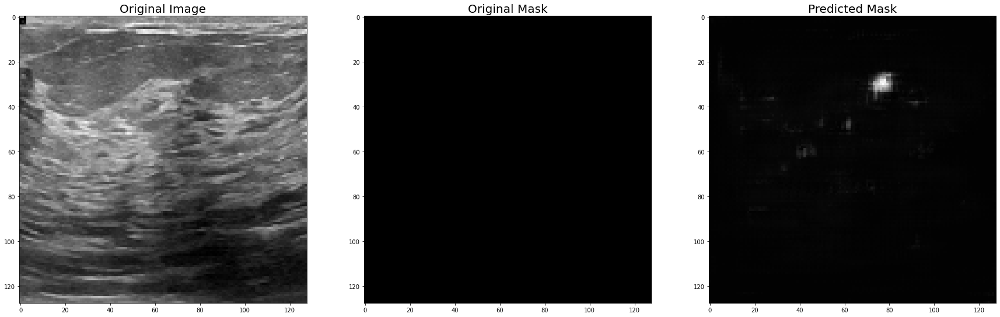

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


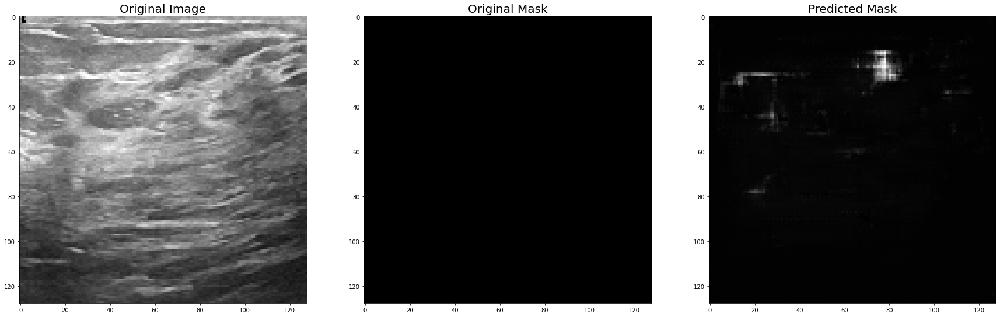

Found 156 validated image filenames.
Found 156 validated image filenames.


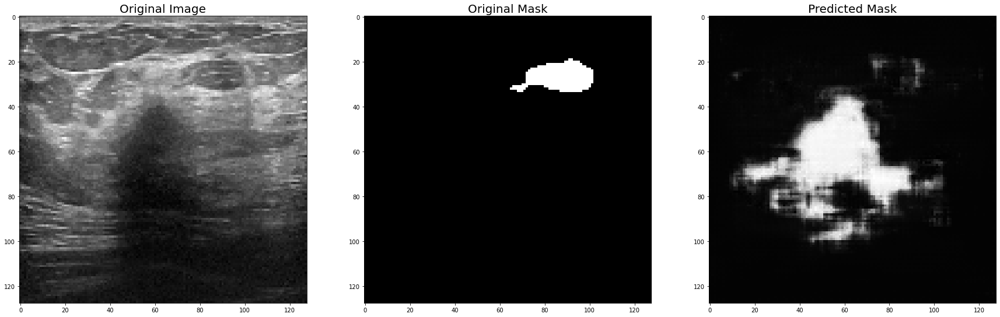

Found 156 validated image filenames.
Found 156 validated image filenames.


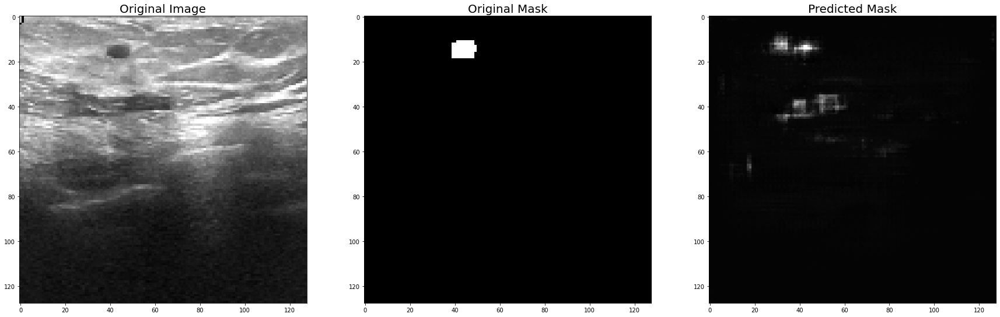

Epoch 62/100
62/62 [==============================] - ETA: 0s - loss: 0.9880 - MaskGen_loss: 0.0117 - Classifier_loss: 0.9763Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 319ms/step - loss: 0.9880 - MaskGen_loss: 0.0117 - Classifier_loss: 0.9763 - val_loss: 1.0359 - val_MaskGen_loss: 0.0396 - val_Classifier_loss: 0.9962
Epoch 63/100
62/62 [==============================] - ETA: 0s - loss: 0.9898 - MaskGen_loss: 0.0111 - Classifier_loss: 0.9787Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 321ms/step - loss: 0.9898 - MaskGen_loss: 0.0111 - Classifier_loss: 0.9787 - val_loss: 1.0215 - val_MaskGen_loss: 0.0383 - val_Classifier_loss: 0.9832
Epoch 64/100
62/62 [==============================] - ETA: 0s - loss: 0.9922 - MaskGen_loss: 0.0111 - Classifier_loss: 0.9811Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

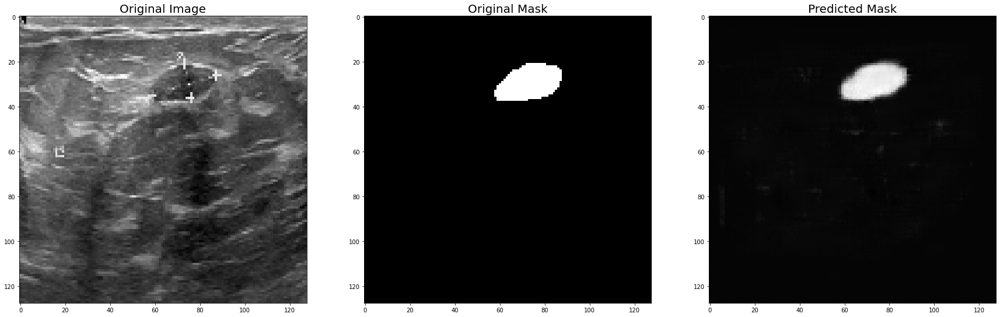

Found 624 validated image filenames.
Found 624 validated image filenames.


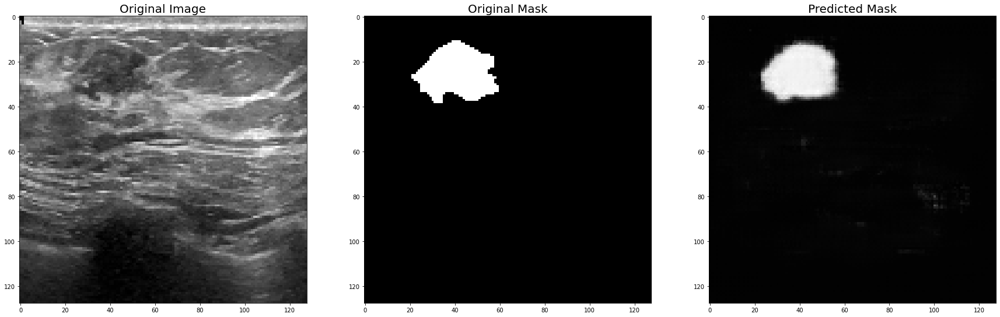

Found 624 validated image filenames.
Found 624 validated image filenames.


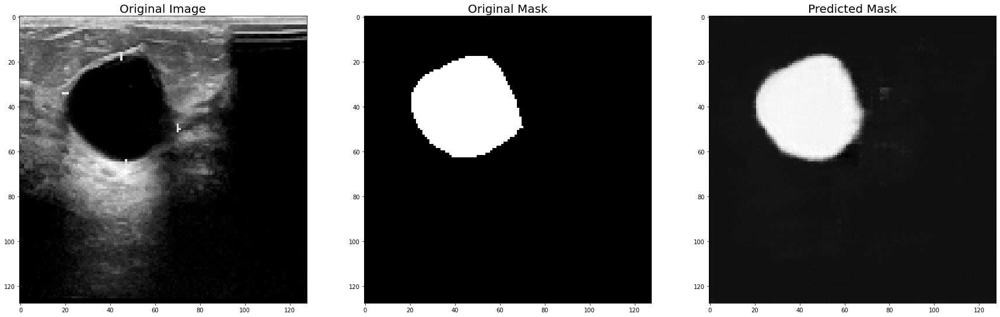

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


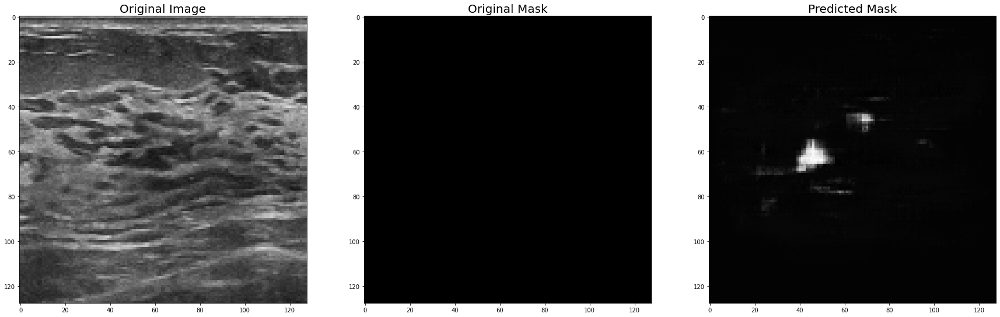

Found 156 validated image filenames.
Found 156 validated image filenames.


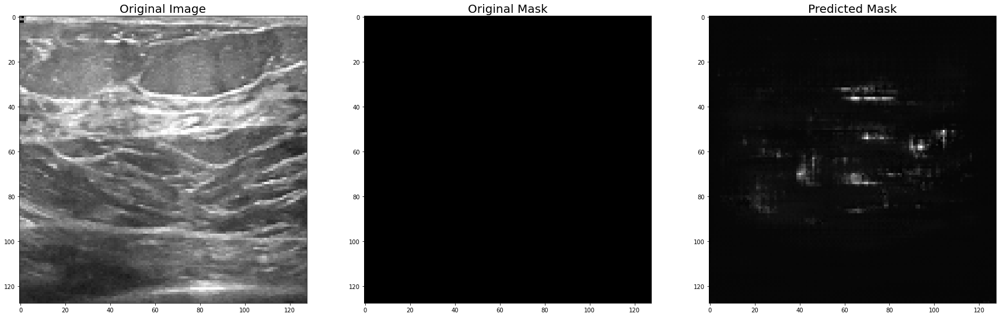

Found 156 validated image filenames.
Found 156 validated image filenames.


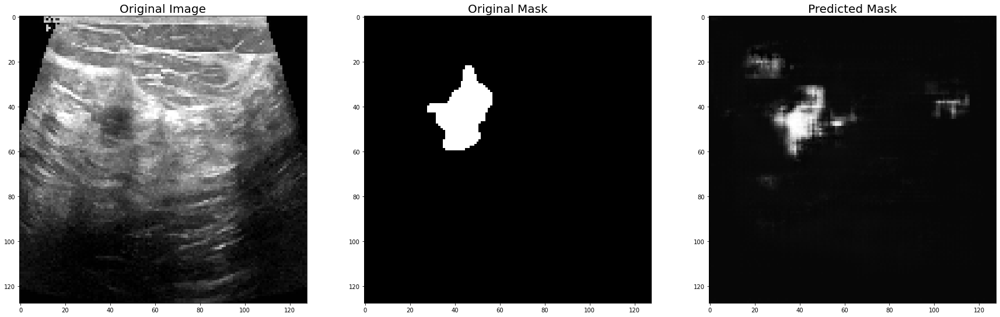

Epoch 67/100
62/62 [==============================] - ETA: 0s - loss: 0.9857 - MaskGen_loss: 0.0086 - Classifier_loss: 0.9771Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 318ms/step - loss: 0.9857 - MaskGen_loss: 0.0086 - Classifier_loss: 0.9771 - val_loss: 1.0108 - val_MaskGen_loss: 0.0374 - val_Classifier_loss: 0.9734
Epoch 68/100
62/62 [==============================] - ETA: 0s - loss: 0.9882 - MaskGen_loss: 0.0084 - Classifier_loss: 0.9798Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 325ms/step - loss: 0.9882 - MaskGen_loss: 0.0084 - Classifier_loss: 0.9798 - val_loss: 1.0210 - val_MaskGen_loss: 0.0379 - val_Classifier_loss: 0.9831
Epoch 69/100
62/62 [==============================] - ETA: 0s - loss: 0.9844 - MaskGen_loss: 0.0082 - Classifier_loss: 0.9762Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

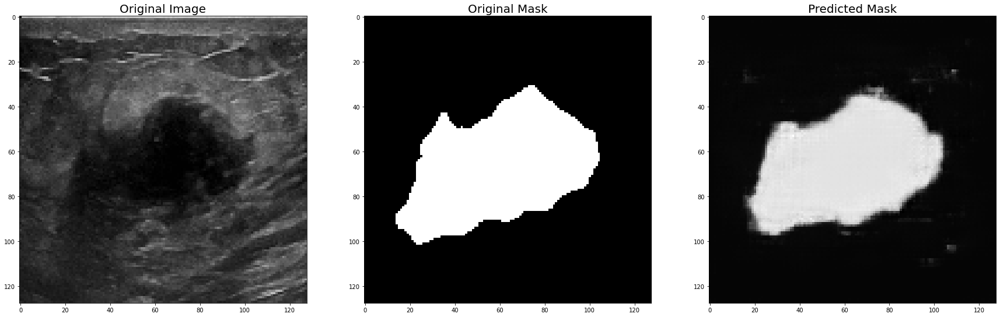

Found 624 validated image filenames.
Found 624 validated image filenames.


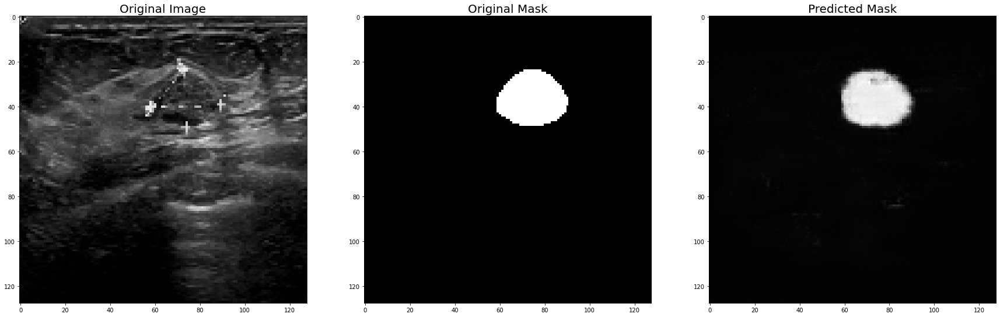

Found 624 validated image filenames.
Found 624 validated image filenames.


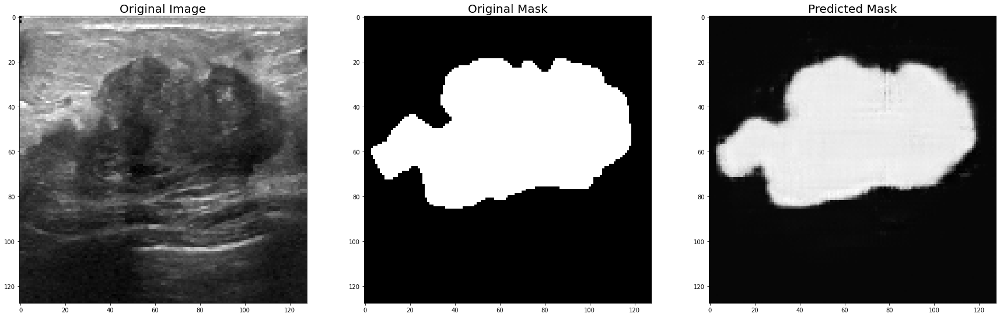

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


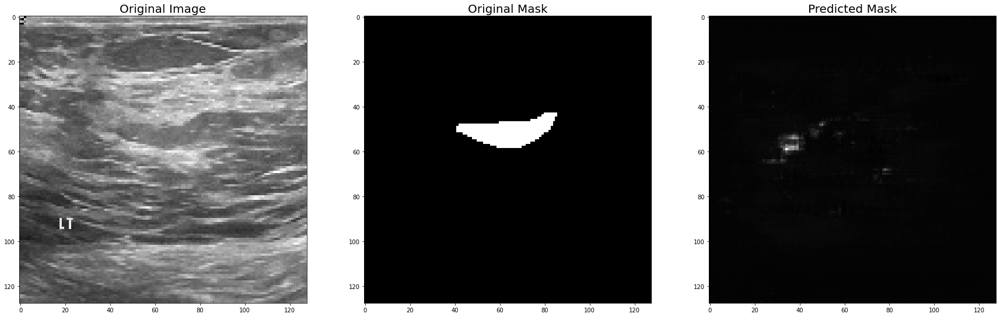

Found 156 validated image filenames.
Found 156 validated image filenames.


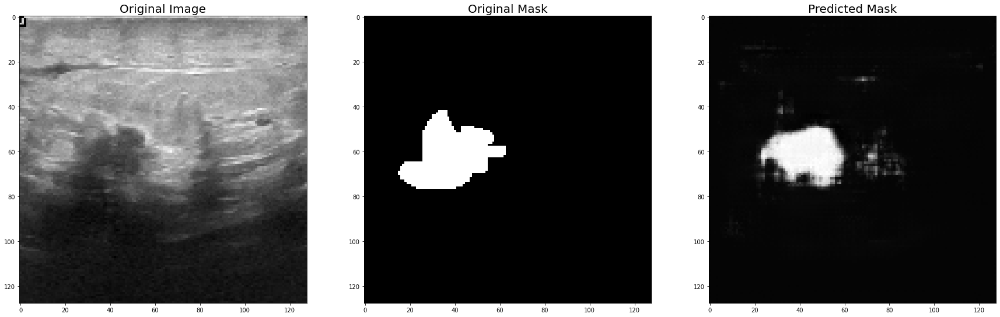

Found 156 validated image filenames.
Found 156 validated image filenames.


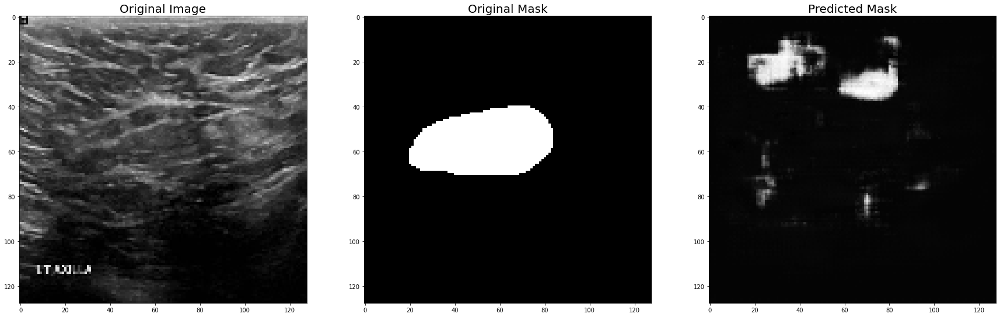

Epoch 72/100
62/62 [==============================] - ETA: 0s - loss: 0.9860 - MaskGen_loss: 0.0077 - Classifier_loss: 0.9783Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 325ms/step - loss: 0.9860 - MaskGen_loss: 0.0077 - Classifier_loss: 0.9783 - val_loss: 1.0189 - val_MaskGen_loss: 0.0392 - val_Classifier_loss: 0.9798
Epoch 73/100
62/62 [==============================] - ETA: 0s - loss: 0.9906 - MaskGen_loss: 0.0076 - Classifier_loss: 0.9830Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 22s 351ms/step - loss: 0.9906 - MaskGen_loss: 0.0076 - Classifier_loss: 0.9830 - val_loss: 1.0248 - val_MaskGen_loss: 0.0383 - val_Classifier_loss: 0.9865
Epoch 74/100
62/62 [==============================] - ETA: 0s - loss: 0.9844 - MaskGen_loss: 0.0073 - Classifier_loss: 0.9771Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

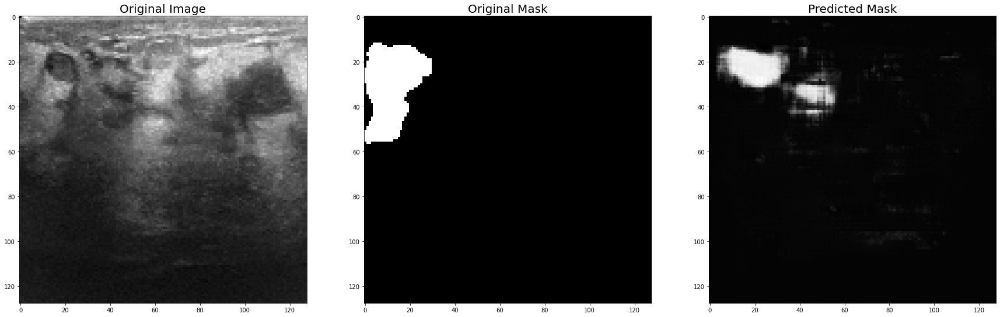

Found 624 validated image filenames.
Found 624 validated image filenames.


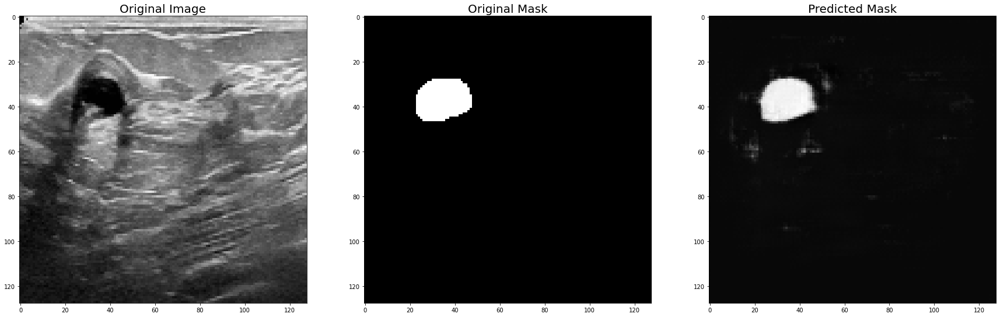

Found 624 validated image filenames.
Found 624 validated image filenames.


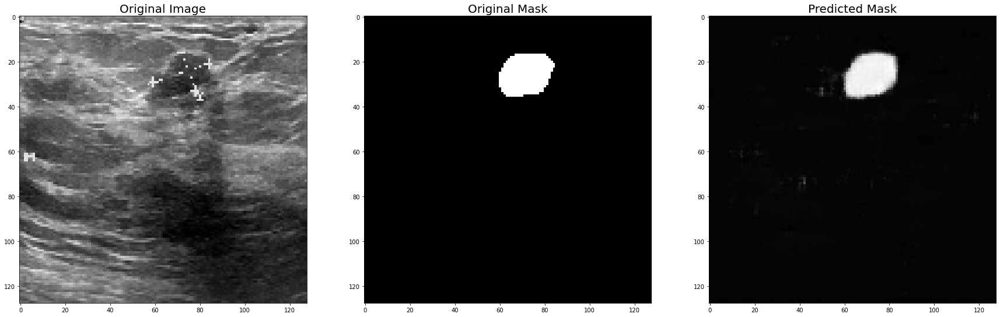

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


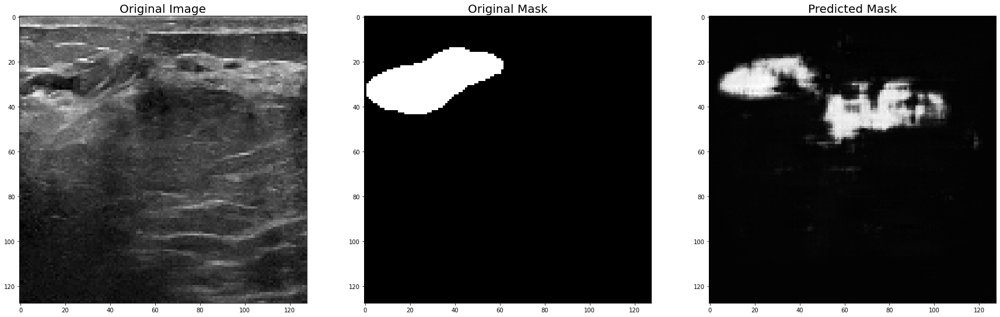

Found 156 validated image filenames.
Found 156 validated image filenames.


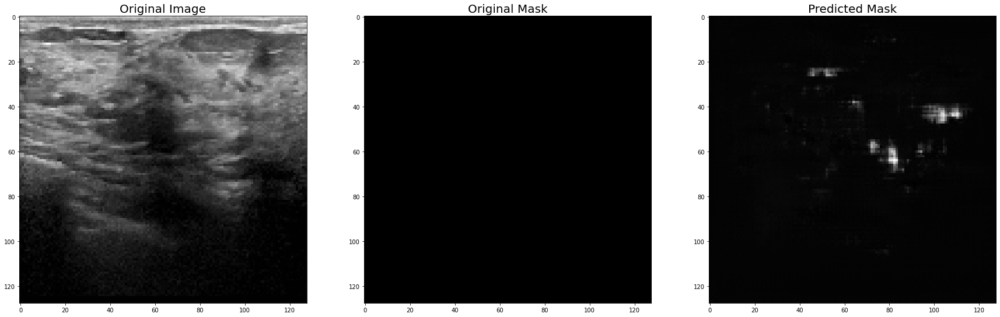

Found 156 validated image filenames.
Found 156 validated image filenames.


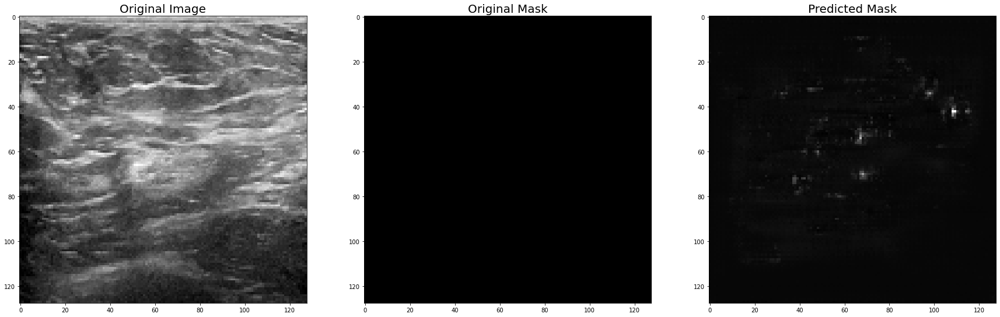

Epoch 77/100
62/62 [==============================] - ETA: 0s - loss: 0.9859 - MaskGen_loss: 0.0068 - Classifier_loss: 0.9791Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 327ms/step - loss: 0.9859 - MaskGen_loss: 0.0068 - Classifier_loss: 0.9791 - val_loss: 1.0050 - val_MaskGen_loss: 0.0398 - val_Classifier_loss: 0.9652
Epoch 78/100
62/62 [==============================] - ETA: 0s - loss: 0.9803 - MaskGen_loss: 0.0069 - Classifier_loss: 0.9734Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 328ms/step - loss: 0.9803 - MaskGen_loss: 0.0069 - Classifier_loss: 0.9734 - val_loss: 1.0157 - val_MaskGen_loss: 0.0393 - val_Classifier_loss: 0.9764
Epoch 79/100
62/62 [==============================] - ETA: 0s - loss: 0.9881 - MaskGen_loss: 0.0067 - Classifier_loss: 0.9814Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

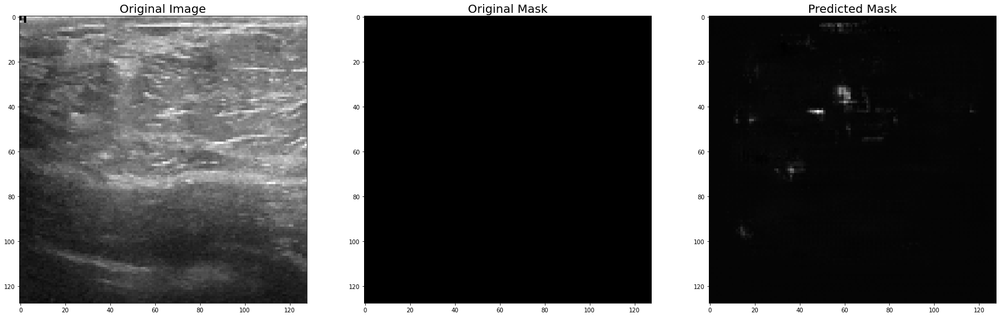

Found 624 validated image filenames.
Found 624 validated image filenames.


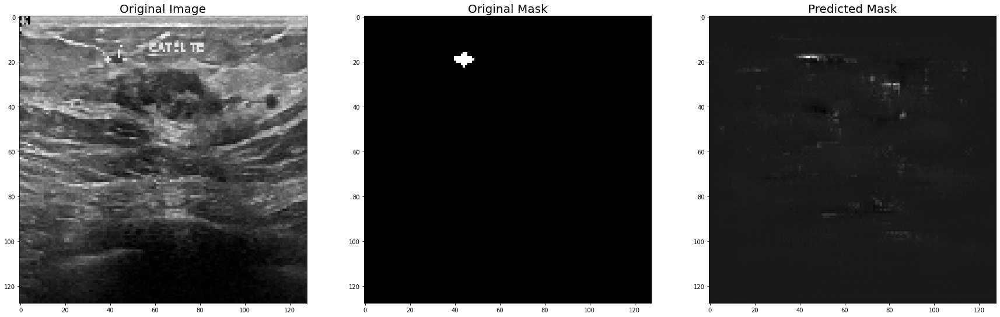

Found 624 validated image filenames.
Found 624 validated image filenames.


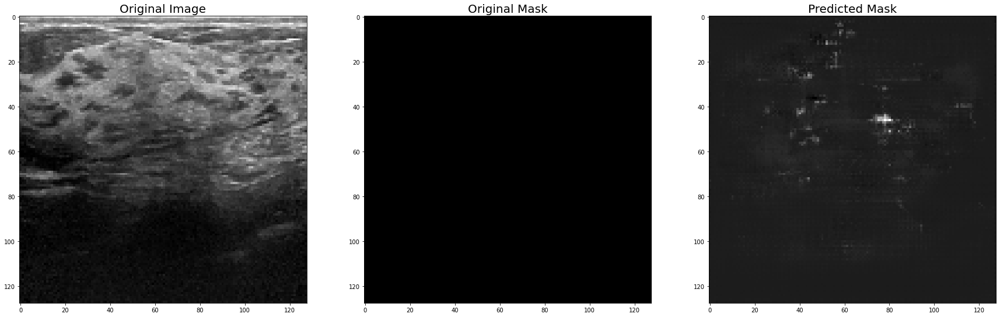

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


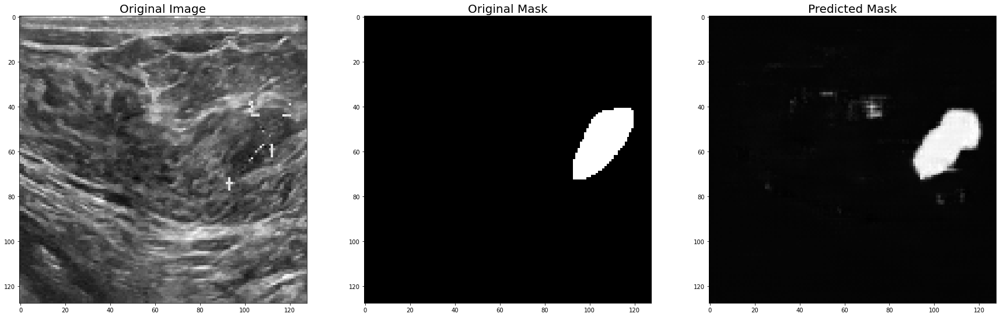

Found 156 validated image filenames.
Found 156 validated image filenames.


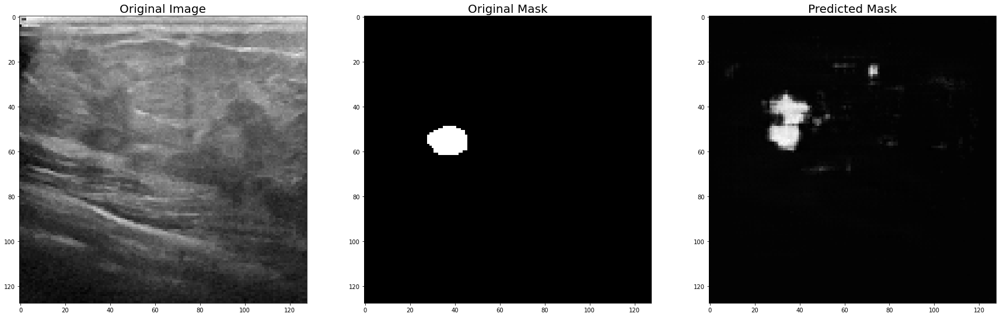

Found 156 validated image filenames.
Found 156 validated image filenames.


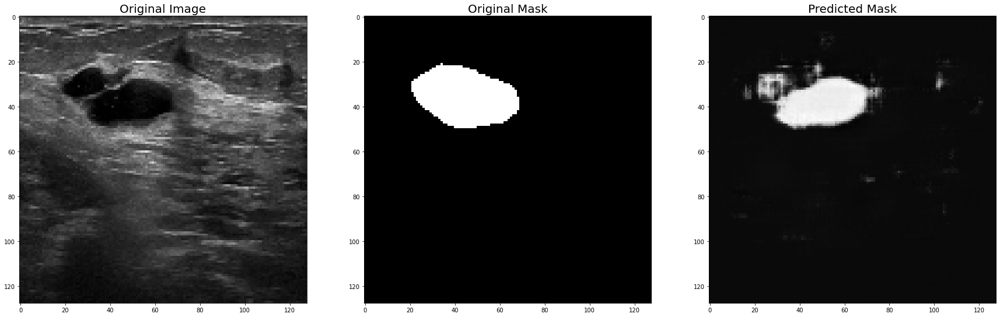

Epoch 82/100
62/62 [==============================] - ETA: 0s - loss: 0.9857 - MaskGen_loss: 0.0062 - Classifier_loss: 0.9794Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 19s 313ms/step - loss: 0.9857 - MaskGen_loss: 0.0062 - Classifier_loss: 0.9794 - val_loss: 1.0071 - val_MaskGen_loss: 0.0370 - val_Classifier_loss: 0.9700
Epoch 83/100
62/62 [==============================] - ETA: 0s - loss: 0.9844 - MaskGen_loss: 0.0062 - Classifier_loss: 0.9782Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 21s 334ms/step - loss: 0.9844 - MaskGen_loss: 0.0062 - Classifier_loss: 0.9782 - val_loss: 1.0217 - val_MaskGen_loss: 0.0386 - val_Classifier_loss: 0.9831
Epoch 84/100
62/62 [==============================] - ETA: 0s - loss: 0.9866 - MaskGen_loss: 0.0060 - Classifier_loss: 0.9806Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

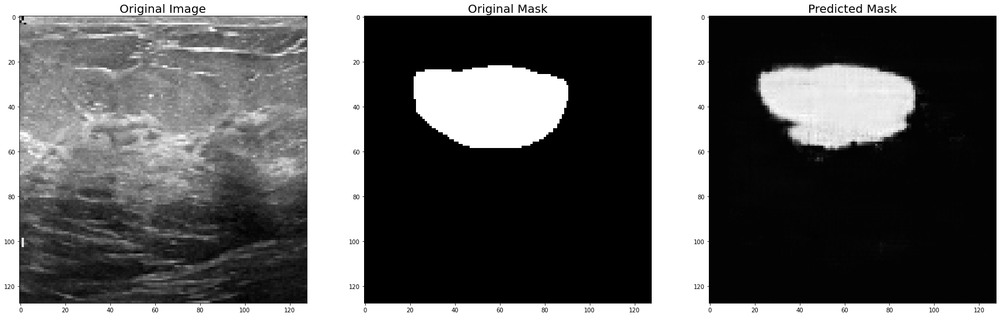

Found 624 validated image filenames.
Found 624 validated image filenames.


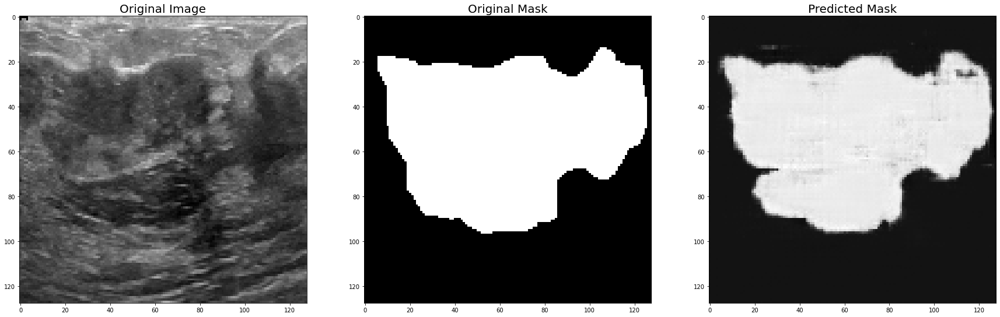

Found 624 validated image filenames.
Found 624 validated image filenames.


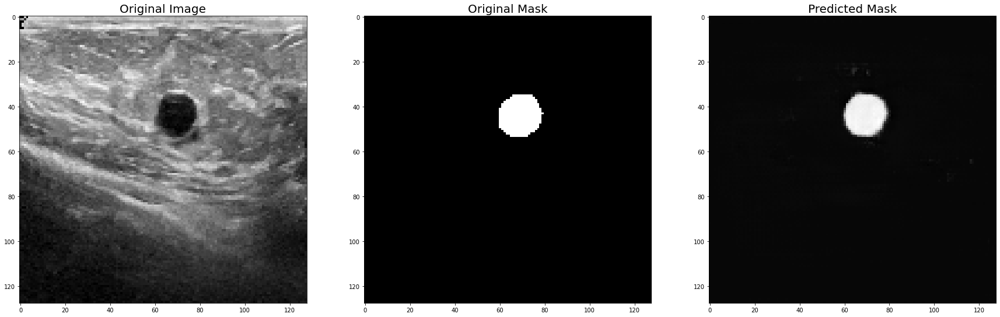

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


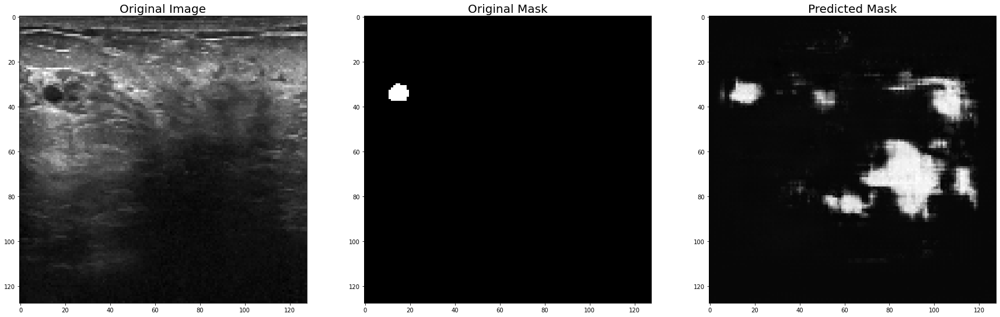

Found 156 validated image filenames.
Found 156 validated image filenames.


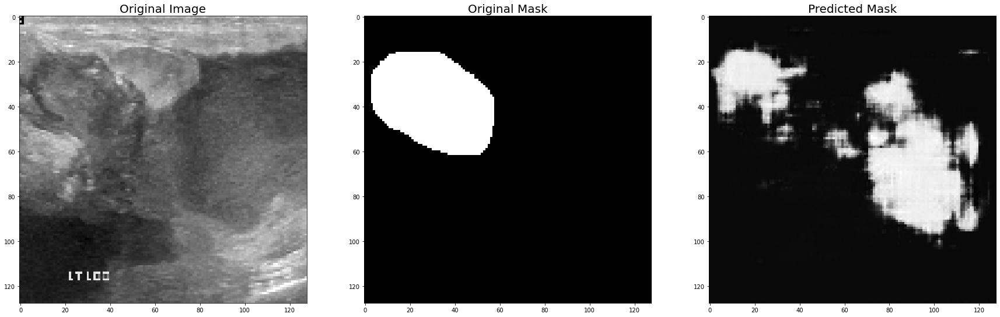

Found 156 validated image filenames.
Found 156 validated image filenames.


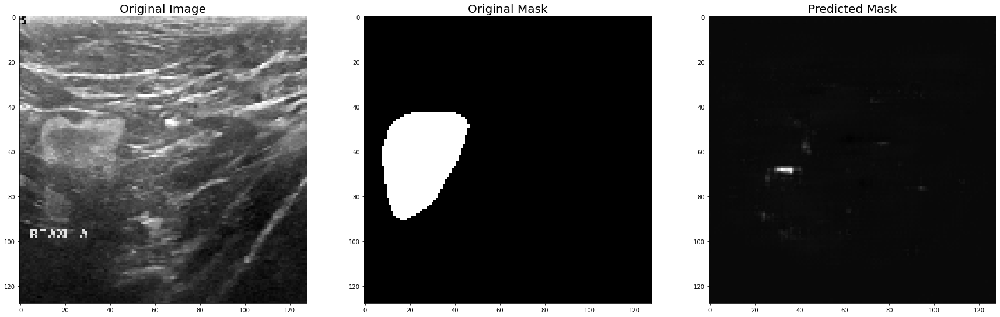

Epoch 87/100
62/62 [==============================] - ETA: 0s - loss: 0.9841 - MaskGen_loss: 0.0059 - Classifier_loss: 0.9782Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 321ms/step - loss: 0.9841 - MaskGen_loss: 0.0059 - Classifier_loss: 0.9782 - val_loss: 1.0183 - val_MaskGen_loss: 0.0400 - val_Classifier_loss: 0.9782
Epoch 88/100
62/62 [==============================] - ETA: 0s - loss: 0.9856 - MaskGen_loss: 0.0058 - Classifier_loss: 0.9798Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 19s 315ms/step - loss: 0.9856 - MaskGen_loss: 0.0058 - Classifier_loss: 0.9798 - val_loss: 1.0348 - val_MaskGen_loss: 0.0386 - val_Classifier_loss: 0.9962
Epoch 89/100
62/62 [==============================] - ETA: 0s - loss: 0.9850 - MaskGen_loss: 0.0056 - Classifier_loss: 0.9794Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

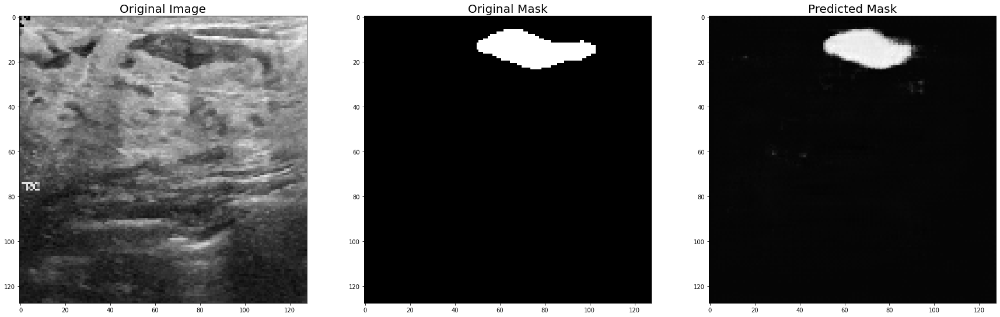

Found 624 validated image filenames.
Found 624 validated image filenames.


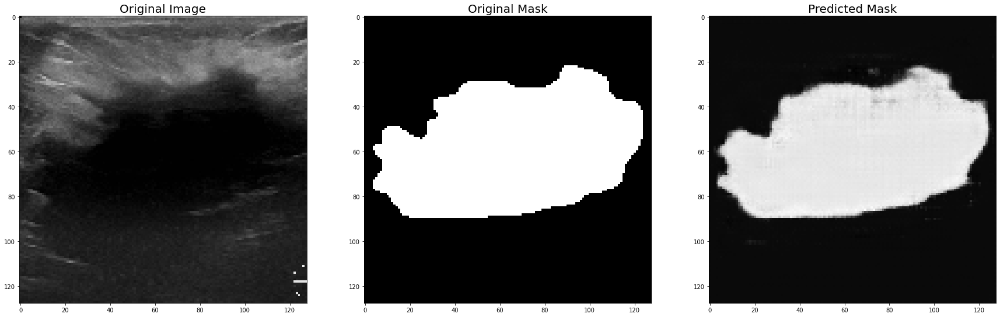

Found 624 validated image filenames.
Found 624 validated image filenames.


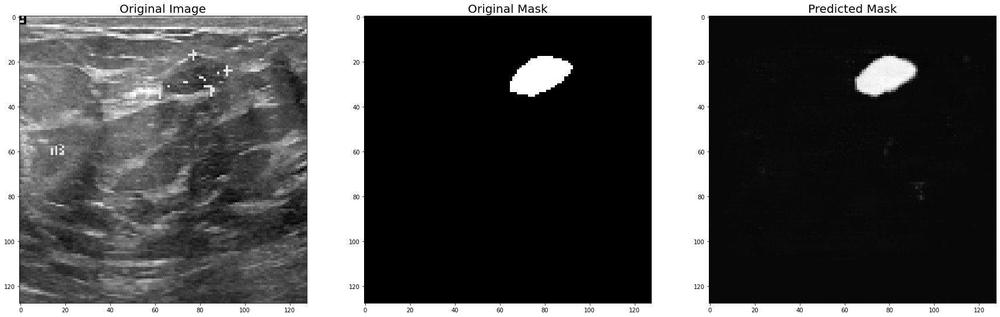

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


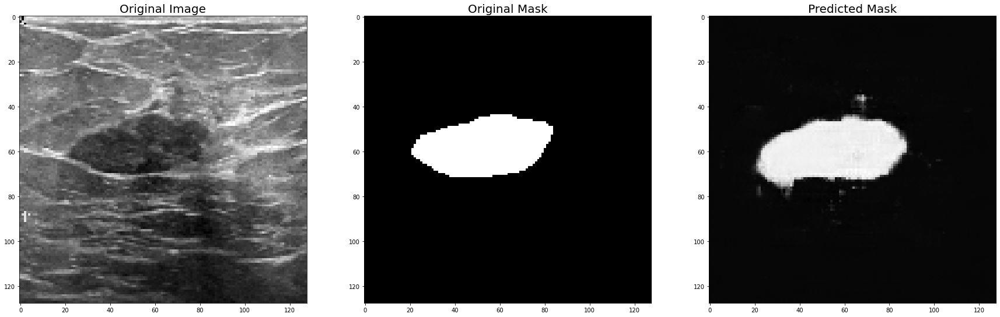

Found 156 validated image filenames.
Found 156 validated image filenames.


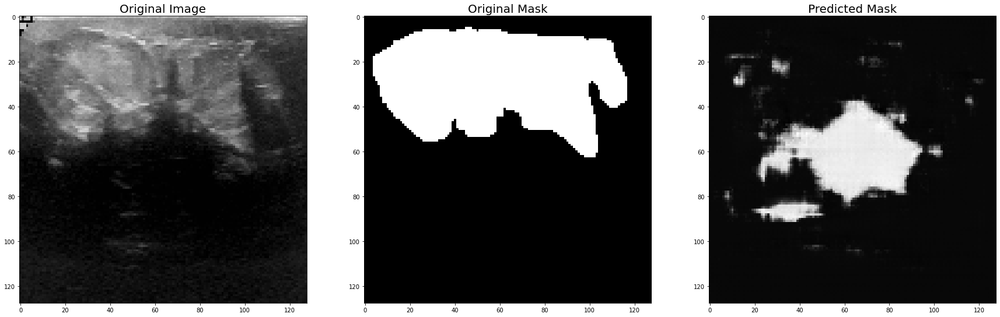

Found 156 validated image filenames.
Found 156 validated image filenames.


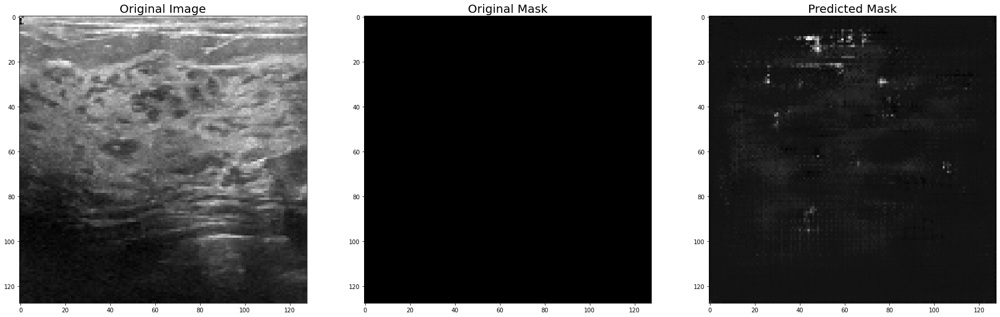

Epoch 92/100
62/62 [==============================] - ETA: 0s - loss: 0.9848 - MaskGen_loss: 0.0053 - Classifier_loss: 0.9794Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 320ms/step - loss: 0.9848 - MaskGen_loss: 0.0053 - Classifier_loss: 0.9794 - val_loss: 1.0421 - val_MaskGen_loss: 0.0411 - val_Classifier_loss: 1.0010
Epoch 93/100
62/62 [==============================] - ETA: 0s - loss: 0.9827 - MaskGen_loss: 0.0052 - Classifier_loss: 0.9774Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 318ms/step - loss: 0.9827 - MaskGen_loss: 0.0052 - Classifier_loss: 0.9774 - val_loss: 1.0170 - val_MaskGen_loss: 0.0406 - val_Classifier_loss: 0.9764
Epoch 94/100
62/62 [==============================] - ETA: 0s - loss: 0.9818 - MaskGen_loss: 0.0052 - Classifier_loss: 0.9766Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

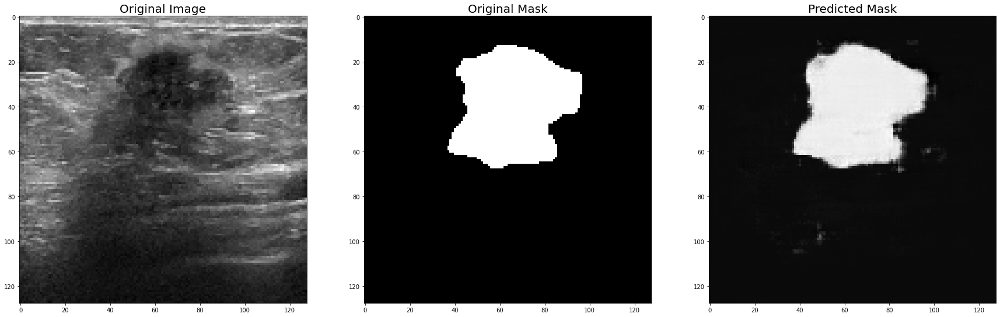

Found 624 validated image filenames.
Found 624 validated image filenames.


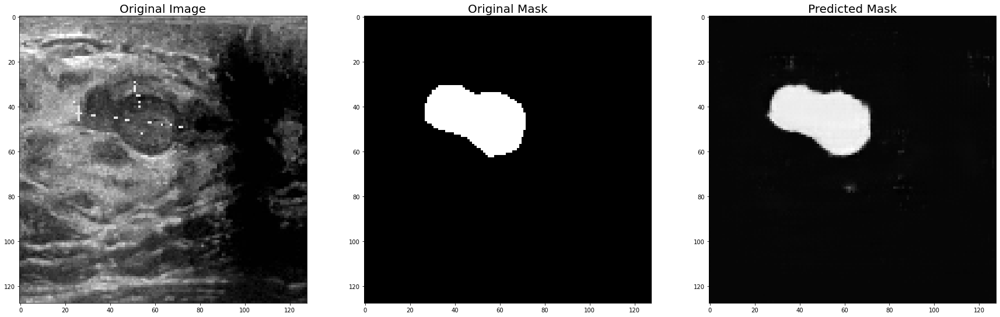

Found 624 validated image filenames.
Found 624 validated image filenames.


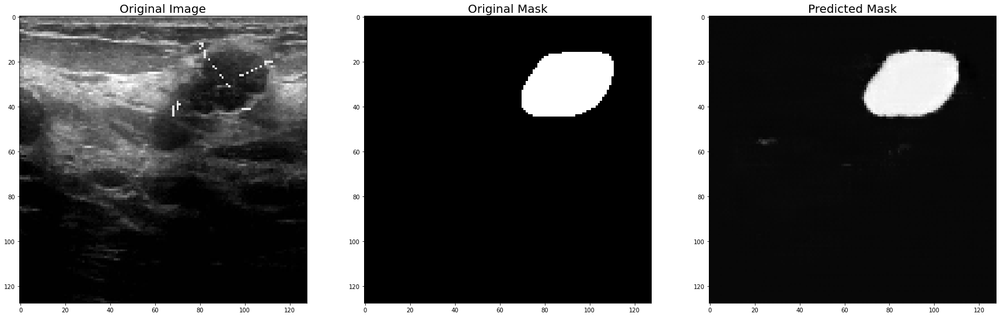

On validation data... 

Found 156 validated image filenames.
Found 156 validated image filenames.


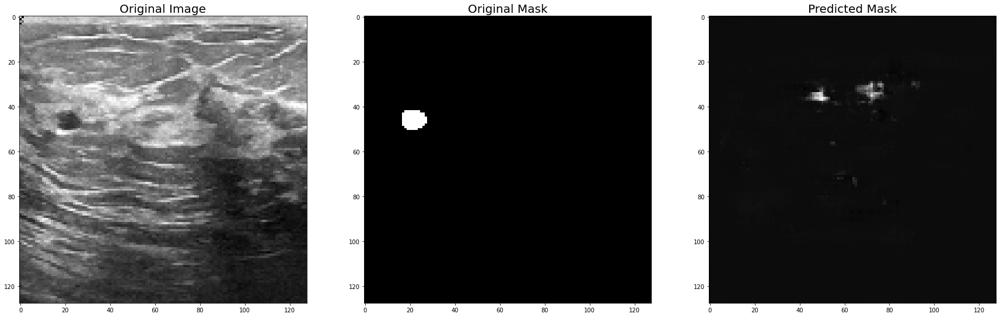

Found 156 validated image filenames.
Found 156 validated image filenames.


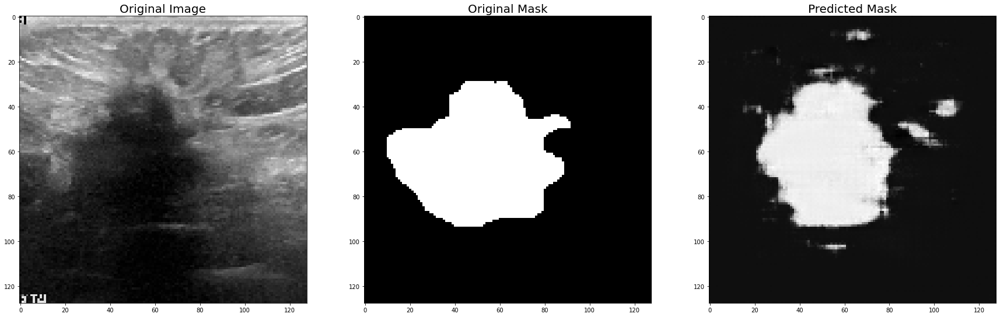

Found 156 validated image filenames.
Found 156 validated image filenames.


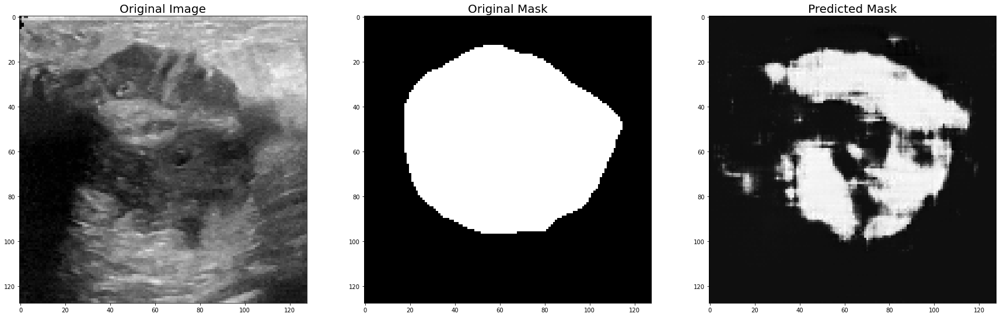

Epoch 97/100
62/62 [==============================] - ETA: 0s - loss: 0.9803 - MaskGen_loss: 0.0049 - Classifier_loss: 0.9754Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 322ms/step - loss: 0.9803 - MaskGen_loss: 0.0049 - Classifier_loss: 0.9754 - val_loss: 1.0331 - val_MaskGen_loss: 0.0418 - val_Classifier_loss: 0.9913
Epoch 98/100
62/62 [==============================] - ETA: 0s - loss: 0.9821 - MaskGen_loss: 0.0047 - Classifier_loss: 0.9774Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [==============================] - 20s 323ms/step - loss: 0.9821 - MaskGen_loss: 0.0047 - Classifier_loss: 0.9774 - val_loss: 1.0430 - val_MaskGen_loss: 0.0420 - val_Classifier_loss: 1.0010
Epoch 99/100
62/62 [==============================] - ETA: 0s - loss: 0.9832 - MaskGen_loss: 0.0046 - Classifier_loss: 0.9786Found 156 validated image filenames.
Found 156 validated image filenames.
62/62 [====

In [17]:
benchmark_generator = get_generator()
benchmark_generator.compile(loss = [['mse'], 
                                    #None,
                                    tf.keras.losses.SparseCategoricalCrossentropy(name = "ClassifierLoss")
                                   ],
                           optimizer = keras.optimizers.Adam(learning_rate = 5e-4)
                           )
ckpt = keras.callbacks.ModelCheckpoint(filepath = f"{benchmark_generator.name}.h5", monitor = "val_loss", save_best_only = True)
reduce_lr = keras.callbacks.ReduceLROnPlateau("val_loss", patience = 20)
benchmark_generator.fit(train_whole_ds, epochs = 100, steps_per_epoch = df_train.shape[0]//batch_size,
                       validation_data = val_whole_ds, validation_steps = df_val.shape[0]//batch_size,
                       callbacks = [ckpt, reduce_lr, show_progress()])

Epoch count 30/30
Found 156 validated image filenames.
Found 156 validated image filenames.


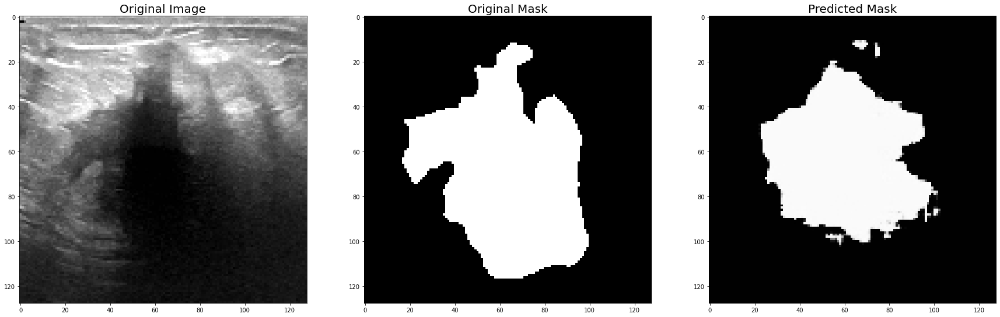

Found 156 validated image filenames.
Found 156 validated image filenames.


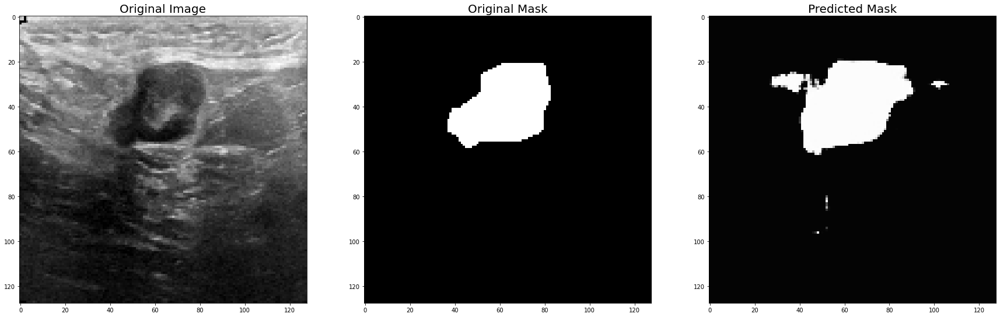

Found 156 validated image filenames.
Found 156 validated image filenames.


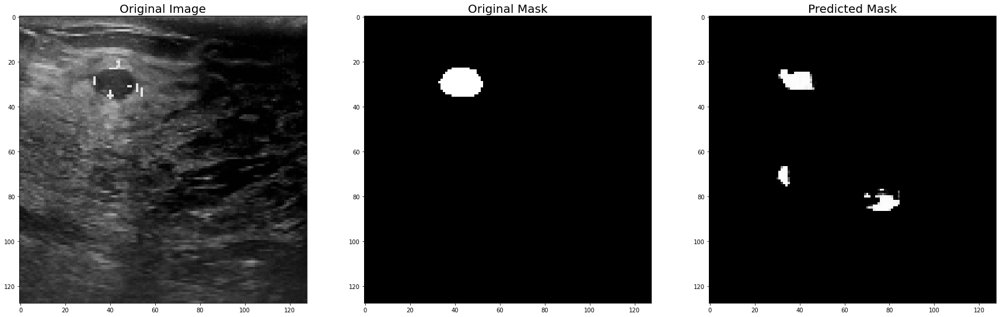

  0%|          | 0/62 [00:00<?, ?it/s]

Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
Found 624 validated image filenames.
F

In [18]:
#fine-tuning the generator in U-net with discriminator
#benchmark_generator = get_generator()

@tf.function
def train_step(input_img, target, label_target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        #1. Generator가 mask 및 label prediction
        gen_mask_output, gen_pred_label = benchmark_generator(input_img, training = True)
        #2. discriminator가 input img와 target pair, input img와 gen_mask_output pair를 discriminate
        disc_real_output = discriminator([input_img, target], training = True)
        disc_gen_output = discriminator([input_img, gen_mask_output], training = True)
        #3. Loss 계산
        disc_loss = discriminator_loss(disc_real_output, disc_gen_output)
        gen_loss, _, _, _ = generator_loss(disc_gen_output, #disc와 연계, discriminator output이 "Truth"가 되게 함 (이걸 generator에게 전달해야 하므로 gen loss)
                                           gen_mask_output, target, #generator가 GT와 차이나지 않게 함
                                           gen_pred_label, label_target)
    generator_grads = gen_tape.gradient(gen_loss, benchmark_generator.trainable_variables)
    discriminator_grads = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gen_opt.apply_gradients(zip(generator_grads, benchmark_generator.trainable_variables))
    disc_opt.apply_gradients(zip(discriminator_grads, discriminator.trainable_variables))
    return gen_loss, disc_loss
traingen_steps = df_train.shape[0]//batch_size
#traingen_steps = 5
print(f"Train step : {train_step}")
from IPython import display #epoch이 반복될 때마다 output을 지워주는 역할
def fit(train_ds, epochs, test_ds, train_step):
    gen_step_history = []
    disc_step_history = []
    gen_history_tot, disc_history_tot = [],[]
    for epoch in tqdm(range(epochs)):
        display.clear_output(wait = True)
        print(f"Epoch count {epoch + 1}/{epochs}")
        
        
        for _ in range(3):
            for img, (mask, lab) in test_ds.take(1):
                test_input = tf.expand_dims(img[0], 0)
                test_target = mask[0]
                generate_images(benchmark_generator, test_input, test_target)

        
        for step in tqdm(range(traingen_steps)):
            for train_img, (train_mask, train_label) in train_ds.take(1):
                gen_loss, disc_loss = train_step(train_img, train_mask, train_label)
                #print(step, gen_loss, disc_loss)
                gen_step_history.append(gen_loss)
                disc_step_history.append(disc_loss)
        gen_loss_stepwise = tf.reduce_mean(np.array(gen_step_history))
        disc_loss_stepwise = tf.reduce_mean(np.array(disc_step_history))
        print(f"Generator loss : {gen_loss_stepwise}", "\n")
        print(f"Discriminator loss : {disc_loss_stepwise}", "\n")
        
        gen_step_history = []
        disc_step_history = []
        
        gen_history_tot.append(gen_loss_stepwise)
        disc_history_tot.append(disc_loss_stepwise)
    return gen_history_tot, disc_history_tot
gen_history_tot, disc_history_tot = fit(train_ds = train_whole_ds, epochs = 30, test_ds = val_whole_ds, train_step = train_step)
benchmark_generator.save('generator_breastSonoGAN.h5')
discriminator.save('discriminator_breastSonoGAN.h5')

# Inference

In [19]:
#benchmark_generator = load_model('../input/example-sono-segmentator-pix2pix-gan/generator_breastSono.h5')
benchmark_generator.summary()

Model: "Generator_Classifier"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
SonoImage (InputLayer)          [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
Encoder1st (Conv2D)             (None, 128, 128, 32) 7808        SonoImage[0][0]                  
__________________________________________________________________________________________________
layer_normalization_48 (LayerNo (None, 128, 128, 32) 64          Encoder1st[0][0]                 
__________________________________________________________________________________________________
activation_46 (Activation)      (None, 128, 128, 32) 0           layer_normalization_48[0][0]     
_______________________________________________________________________________

Found 156 validated image filenames.
Found 156 validated image filenames.


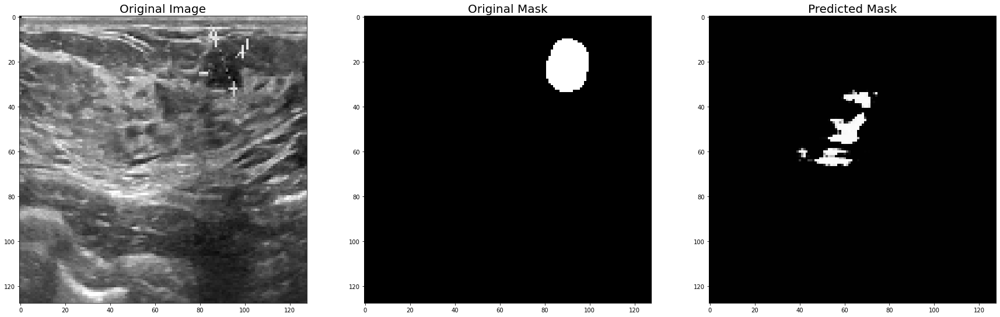

Found 156 validated image filenames.
Found 156 validated image filenames.


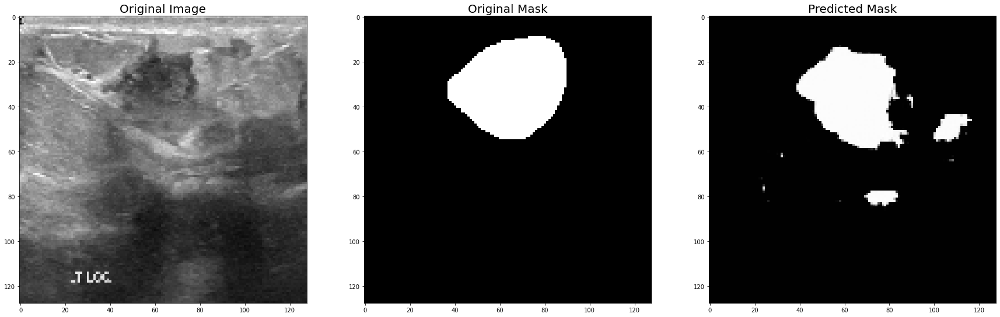

Found 156 validated image filenames.
Found 156 validated image filenames.


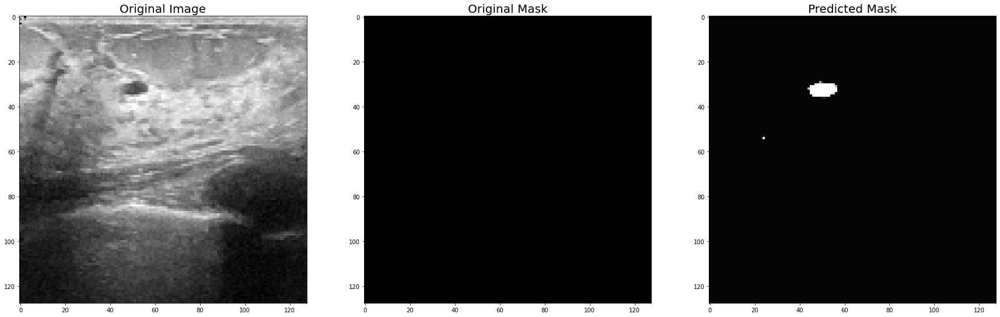

Found 156 validated image filenames.
Found 156 validated image filenames.


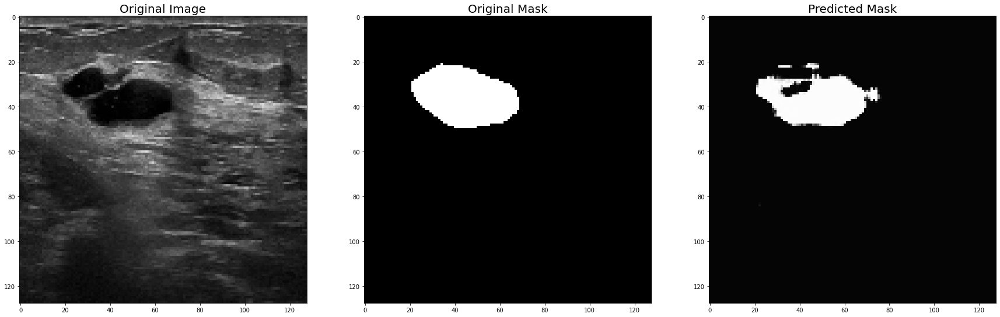

Found 156 validated image filenames.
Found 156 validated image filenames.


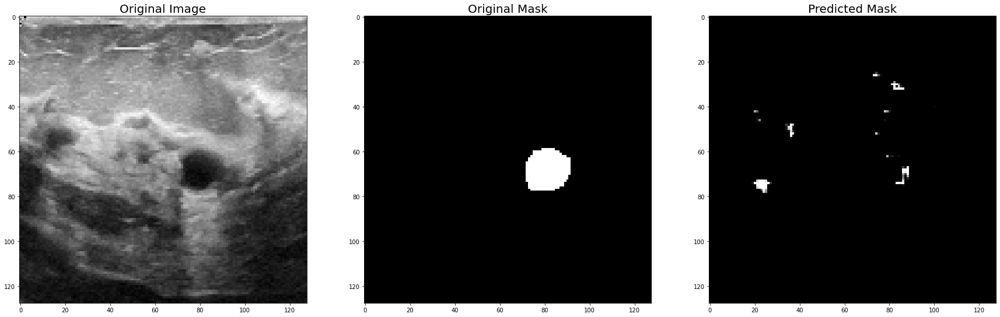

In [20]:
for _ in range(5):
    for img, (mask, lab) in val_whole_ds.take(1):
        test_input = tf.expand_dims(img[0], 0)
        test_target = mask[0]
        generate_images(benchmark_generator, test_input, test_target)